In [70]:
import re
from os import path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


import xgboost as xgb 
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression


from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import (train_test_split, GridSearchCV, RandomizedSearchCV)


import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

## Constant

In [71]:
LABEL_COLUMNS = 'churn_probability'
DATA_DIR = "./data"

# Input dataset
train_dataset = path.join(DATA_DIR, 'train.csv')
unseen_dataset = path.join(DATA_DIR, 'test.csv')


# Output dataset
x_train_pca = path.join(DATA_DIR, "X_train_PCA_output.csv")
x_test_pca = path.join(DATA_DIR, "X_test_PCA_output.csv")

y_train_pca = path.join(DATA_DIR, "y_train_PCA_output.csv")
y_test_pca = path.join(DATA_DIR, "y_test_PCA_output.csv")

x_unseen_pca = path.join(DATA_DIR, "X_unseen_PCA_output.csv")
y_unseen_pca = path.join(DATA_DIR, "y_unseen_PCA_output.csv")

# Understanding the data

In [72]:
# Read all data
# Train data
data = pd.read_csv(train_dataset)

# Prediction Data
unseen = pd.read_csv(unseen_dataset)

In [73]:
data.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)

In [74]:
unseen.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7',
       'fb_user_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g'],
      dtype='object', length=171)

In [75]:
ids = ['id','circle_id']
total_amounts = [i for i in list(data.columns) if re.search('total.+amt',i)]
total_outgoing_minutes = [i for i in list(data.columns) if re.search('total.+og.+mou',i)]
offnetwork_minutes = [i for i in list(data.columns) if re.search('offnet',i)]
average_revenue_3g = [i for i in list(data.columns) if re.search('arpu.+3g',i)]
average_revenue_2g = [i for i in list(data.columns) if re.search('arpu.+2g',i)]
volume_3g = [i for i in list(data.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(data.columns) if re.search('vol.+2g',i)]
age_on_network = [i for i in list(data.columns) if re.search('aon',i)]

#Storing them in a single flat list
variables = [*ids, 
             *total_amounts, 
             *total_outgoing_minutes, 
             *offnetwork_minutes, 
             *average_revenue_3g, 
             *average_revenue_2g,
             *volume_3g,
             *volume_2g,
             *age_on_network
             ]

data1 = data[variables +  [LABEL_COLUMNS]].set_index('id')

unseen1 = unseen[variables]

data1.head()

,circle_id,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,arpu_2g_7,arpu_2g_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,aon,churn_probability
id,,,,,,,,,,,,,,,,,,,,,
0,109,77,65,10,81.21,221.68,3.63,32.24,96.68,2.33,...,NaN,NaN,0.0,0.00,0.0,0.0,0.00,0.00,1958,0
1,109,0,145,50,0.00,30.73,31.66,0.00,25.99,30.89,...,122.08,NaN,0.0,3.96,0.0,0.0,352.91,0.00,710,0
2,109,70,120,0,56.49,99.36,0.00,53.99,82.05,0.00,...,NaN,NaN,0.0,0.00,0.0,0.0,0.00,0.00,882,0
3,109,160,240,130,76.03,95.98,53.84,68.76,78.48,50.23,...,NaN,NaN,0.0,0.00,0.0,0.0,0.00,0.00,982,0
4,109,290,136,122,63.26,42.94,15.76,56.99,38.11,9.63,...,35.12,0.0,0.0,0.00,0.0,390.8,308.89,213.47,647,0


In [76]:
data1.columns

Index(['circle_id', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
       'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'vol_3g_mb_6', 'vol_3g_mb_7',
       'vol_3g_mb_8', 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'aon',
       'churn_probability'],
      dtype='object')

In [77]:
unseen1.columns

Index(['id', 'circle_id', 'total_rech_amt_6', 'total_rech_amt_7',
       'total_rech_amt_8', 'total_og_mou_6', 'total_og_mou_7',
       'total_og_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7',
       'arpu_2g_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'vol_2g_mb_6',
       'vol_2g_mb_7', 'vol_2g_mb_8', 'aon'],
      dtype='object')

In [78]:
date_columns = ['last_date_of_month_6', 'last_date_of_month_7',
            'last_date_of_month_8', 'date_of_last_rech_6',
            'date_of_last_rech_7', 'date_of_last_rech_8']

data[date_columns] = data[date_columns].apply(pd.to_datetime)
unseen[date_columns] = unseen[date_columns].apply(pd.to_datetime)

data_types = data.dtypes
data_types = pd.DataFrame(data_types)

In [79]:
data_types = data.dtypes
data_types = pd.DataFrame(data_types)
data_types.head()

,0
id,int64
circle_id,int64
loc_og_t2o_mou,float64
std_og_t2o_mou,float64
loc_ic_t2o_mou,float64


# Preporcessing

### Handling Missing Values

In [80]:
# Finding the columns having more than 70% missing values
pd.set_option('display.max_rows', None)
columns = data.columns
drop_feature = []

for feature in columns:
    if round(data[feature].isna().sum() / data.shape[0] * 100, 2) > 70:
        drop_feature.append(feature)
        

In [81]:
data = data.drop(drop_feature, axis=1)
unseen = unseen.drop(drop_feature, axis=1)
data.shape, unseen.shape

((69999, 142), (30000, 141))

In [82]:
# round(data.isna().sum() / data.shape[0] * 100, 0)

In [83]:
# Relacing missing values by median

columns = data.columns
for feature in columns:
    if feature == LABEL_COLUMNS:
        continue
    
    data[feature].fillna(data[feature].median(), inplace=True)
    unseen[feature].fillna(data[feature].median(), inplace=True)

# data.isna().sum()

### Checking Duplicates

In [84]:
# Dropping duplicate rows
data = data.drop_duplicates()
unseen = unseen.drop_duplicates()
data.shape, unseen.shape

((69999, 142), (30000, 141))

### Dropping the columns having single value 

In [85]:
# (checking for column having only 1 value)

columns = data.columns
drop_feature = []
for feature in columns:
    if data[feature].nunique() == 1:
        drop_feature.append(feature)
        
print('These features have single value : ')
print(drop_feature)

data = data.drop(drop_feature, axis=1)
unseen = unseen.drop(drop_feature, axis=1)
data.shape, unseen.shape

These features have single value : 
['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


((69999, 129), (30000, 128))

### Renaming 3 inconsistent columns

In [86]:
columns = data.columns.to_list()

rename_dict = {
    'aug_vbc_3g':'vbc_3g_8',
    'jul_vbc_3g': 'vbc_3g_7',
    'jun_vbc_3g': 'vbc_3g_6'
    
}

data.rename(columns = rename_dict, inplace = True) 
unseen.rename(columns = rename_dict, inplace = True) 

## Data Visualization

id
unique vaules =  69999


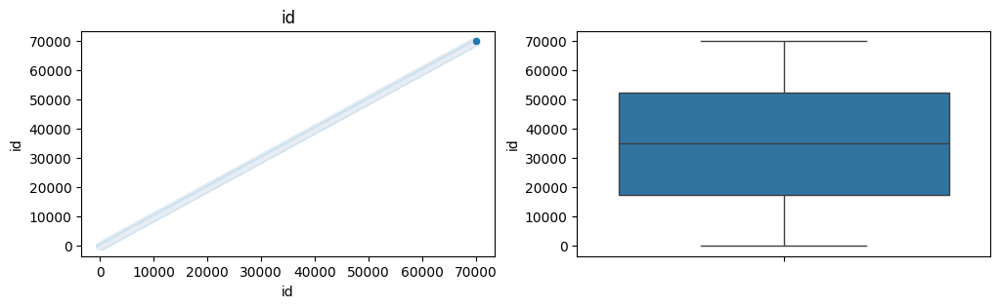

---------------------------------------------------------------------------
arpu_6
unique vaules =  61615


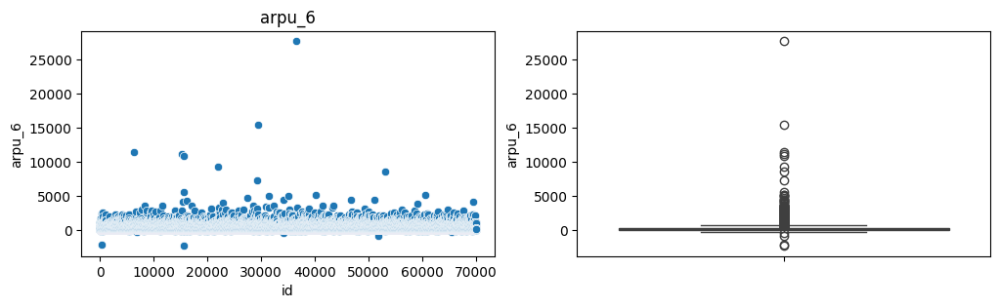

---------------------------------------------------------------------------
arpu_7
unique vaules =  61425


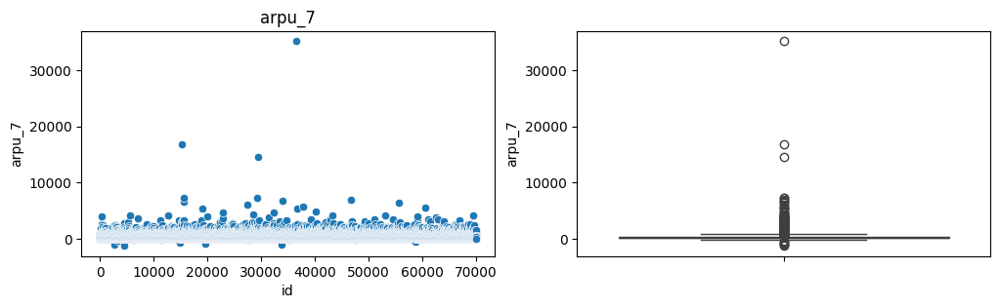

---------------------------------------------------------------------------
arpu_8
unique vaules =  60194


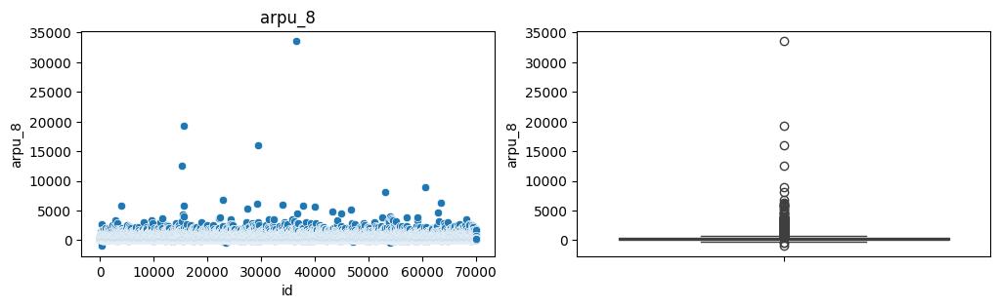

---------------------------------------------------------------------------
onnet_mou_6
unique vaules =  20057


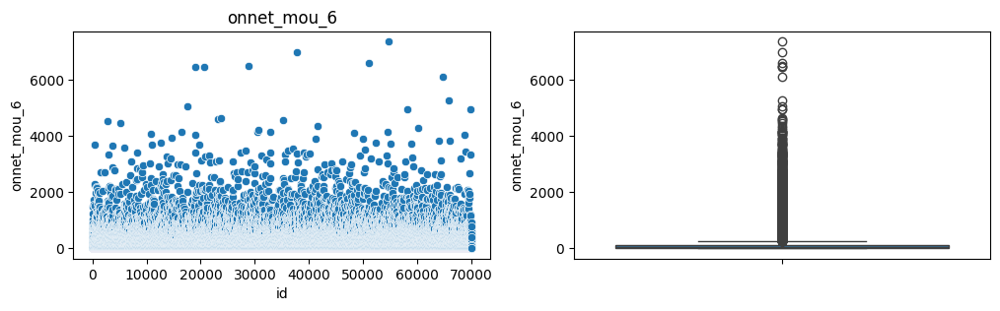

---------------------------------------------------------------------------
onnet_mou_7
unique vaules =  20076


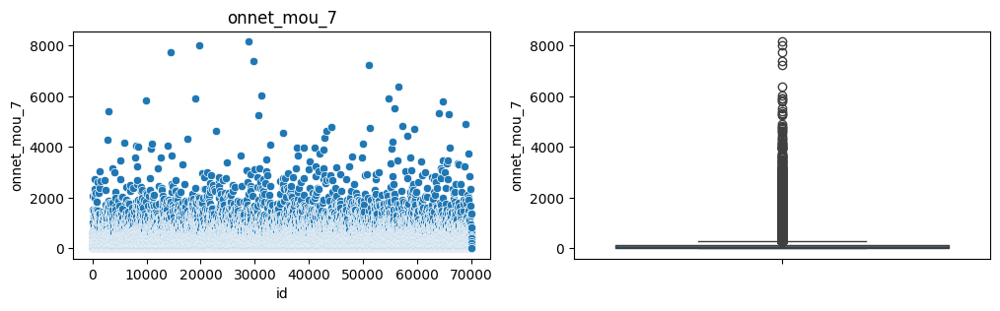

---------------------------------------------------------------------------
onnet_mou_8
unique vaules =  19726


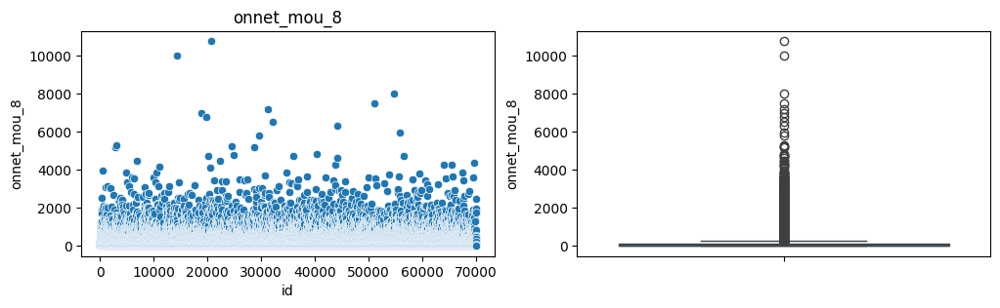

---------------------------------------------------------------------------
offnet_mou_6
unique vaules =  26254


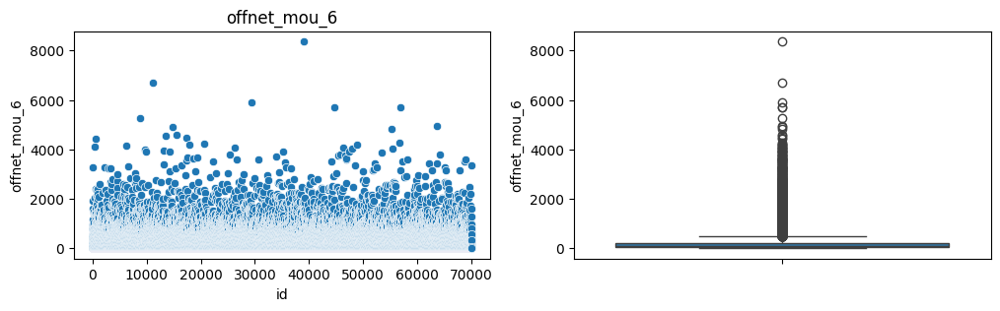

---------------------------------------------------------------------------
offnet_mou_7
unique vaules =  26140


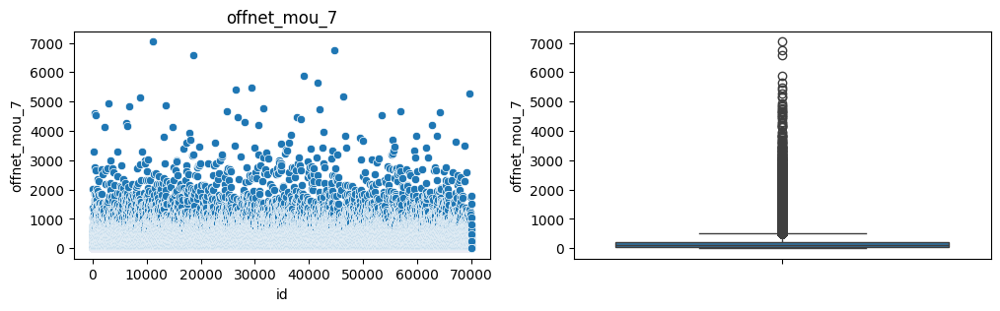

---------------------------------------------------------------------------
offnet_mou_8
unique vaules =  25996


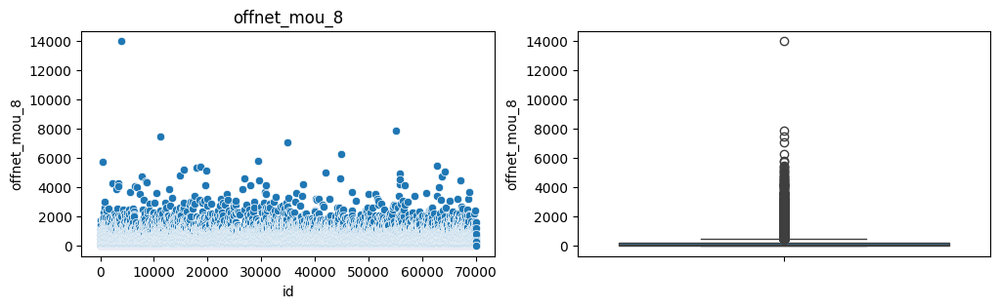

---------------------------------------------------------------------------
roam_ic_mou_6
unique vaules =  5306


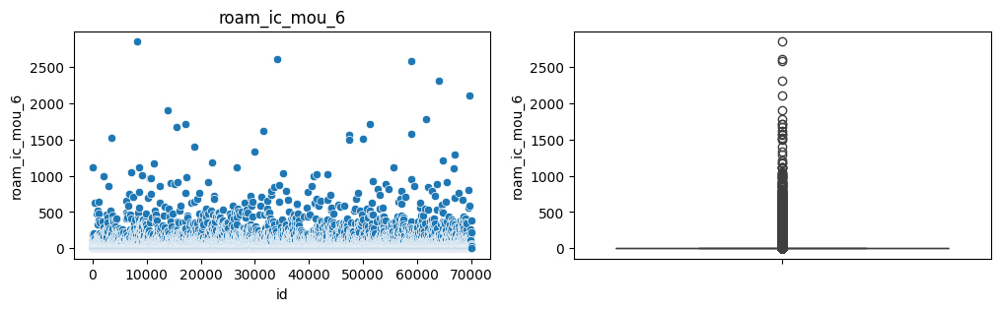

---------------------------------------------------------------------------
roam_ic_mou_7
unique vaules =  4240


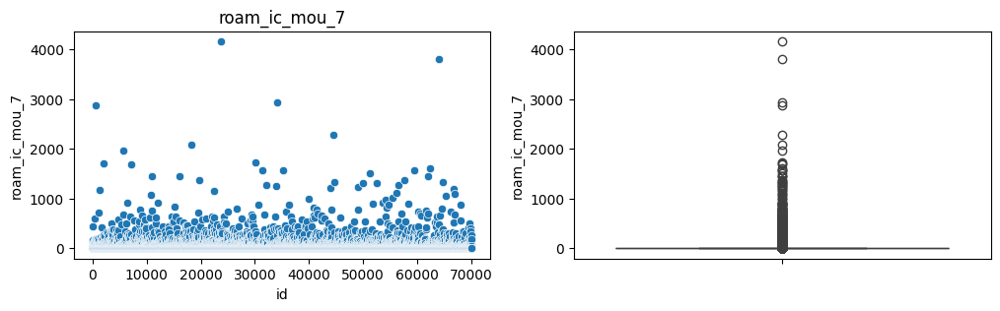

---------------------------------------------------------------------------
roam_ic_mou_8
unique vaules =  4252


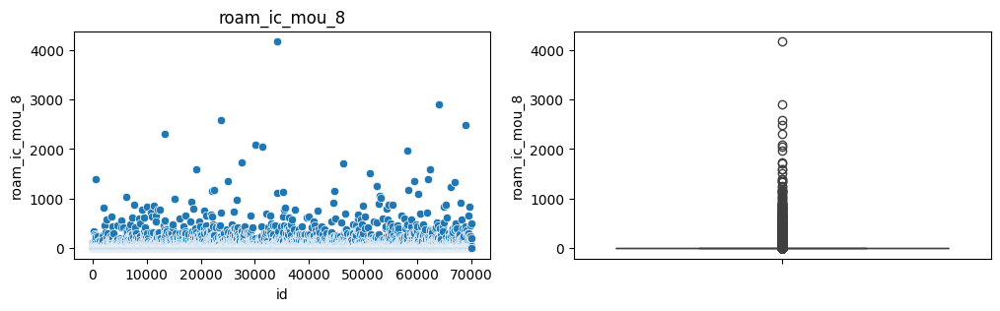

---------------------------------------------------------------------------
roam_og_mou_6
unique vaules =  6568


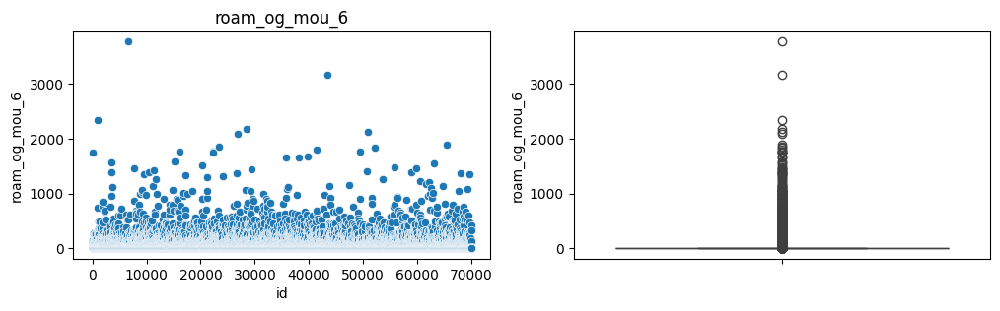

---------------------------------------------------------------------------
roam_og_mou_7
unique vaules =  5305


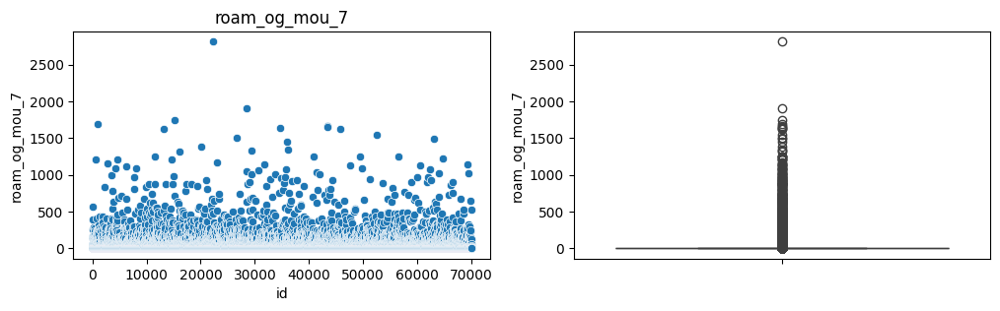

---------------------------------------------------------------------------
roam_og_mou_8
unique vaules =  5215


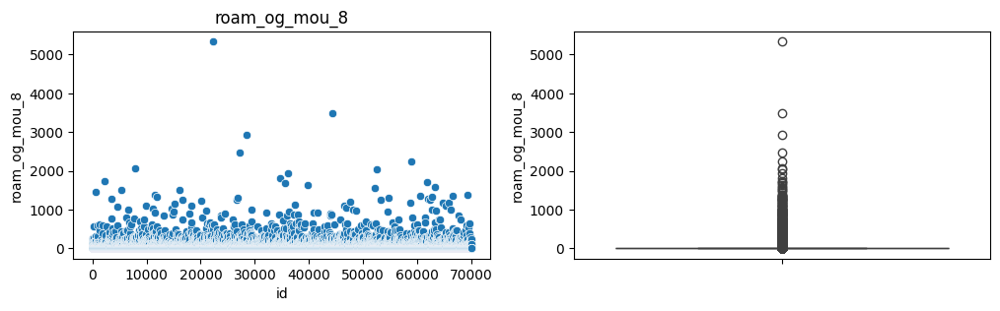

---------------------------------------------------------------------------
loc_og_t2t_mou_6
unique vaules =  11491


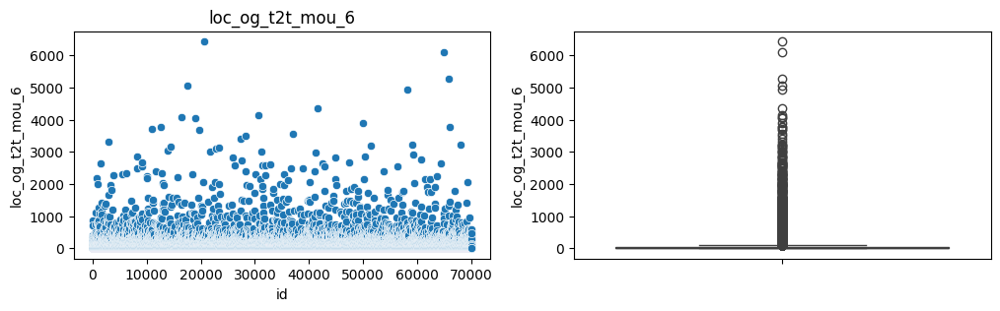

---------------------------------------------------------------------------
loc_og_t2t_mou_7
unique vaules =  11359


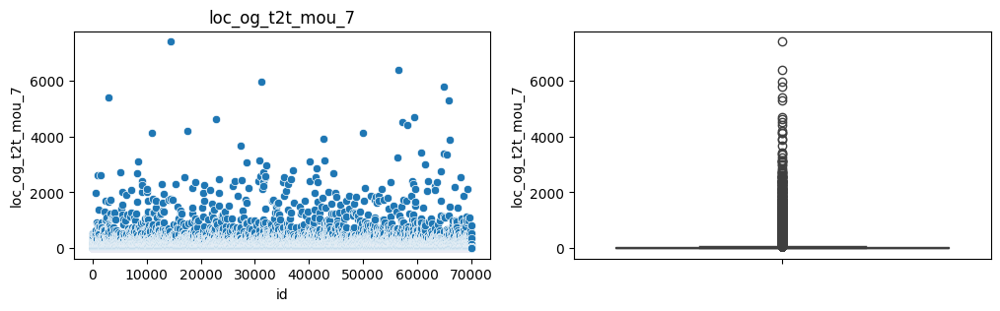

---------------------------------------------------------------------------
loc_og_t2t_mou_8
unique vaules =  11296


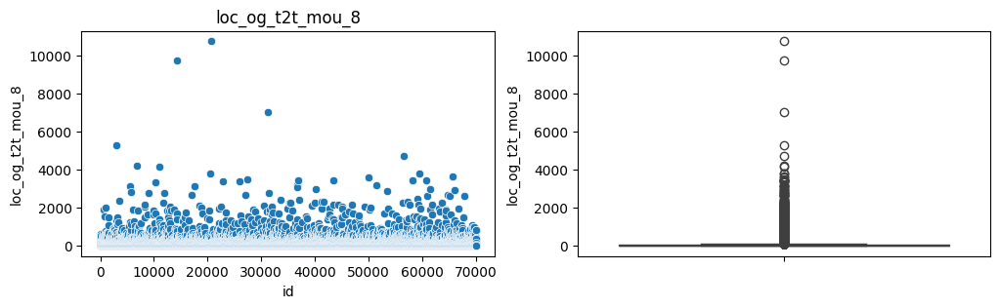

---------------------------------------------------------------------------
loc_og_t2m_mou_6
unique vaules =  17848


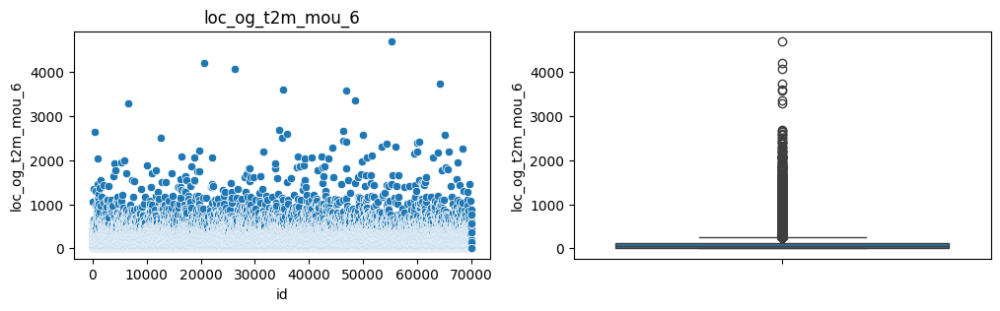

---------------------------------------------------------------------------
loc_og_t2m_mou_7
unique vaules =  17642


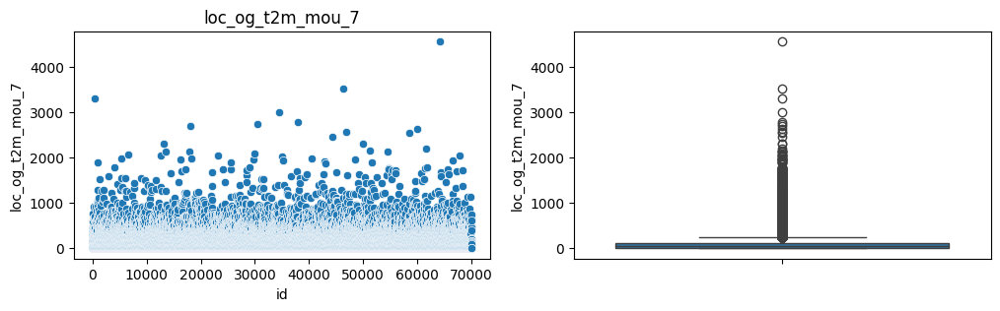

---------------------------------------------------------------------------
loc_og_t2m_mou_8
unique vaules =  17617


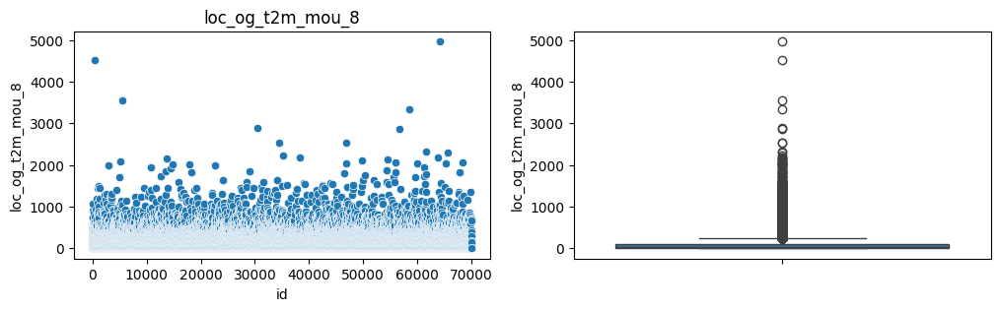

---------------------------------------------------------------------------
loc_og_t2f_mou_6
unique vaules =  3376


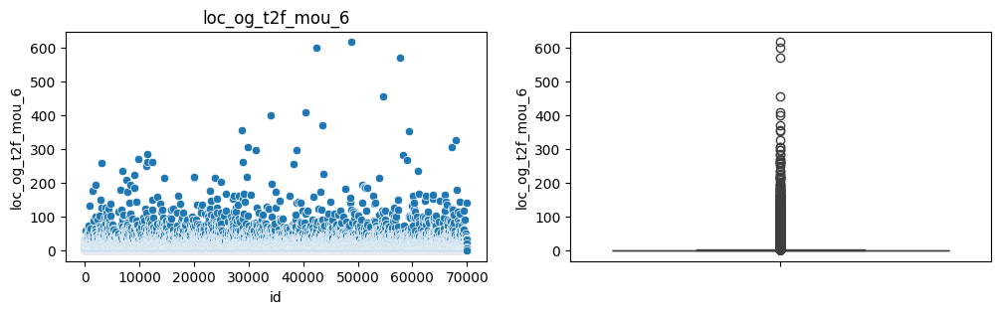

---------------------------------------------------------------------------
loc_og_t2f_mou_7
unique vaules =  3365


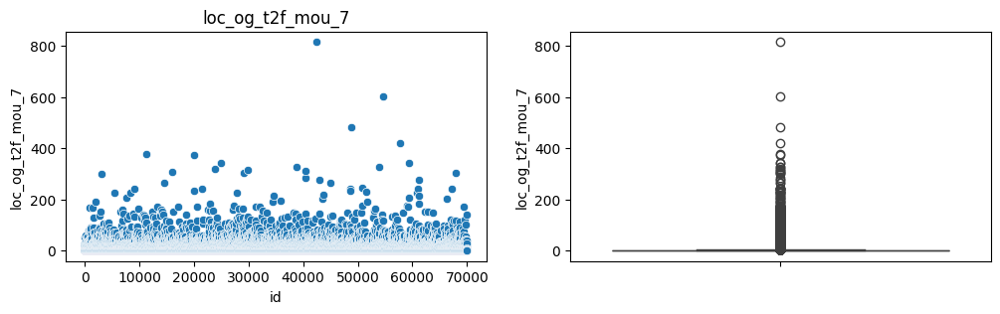

---------------------------------------------------------------------------
loc_og_t2f_mou_8
unique vaules =  3311


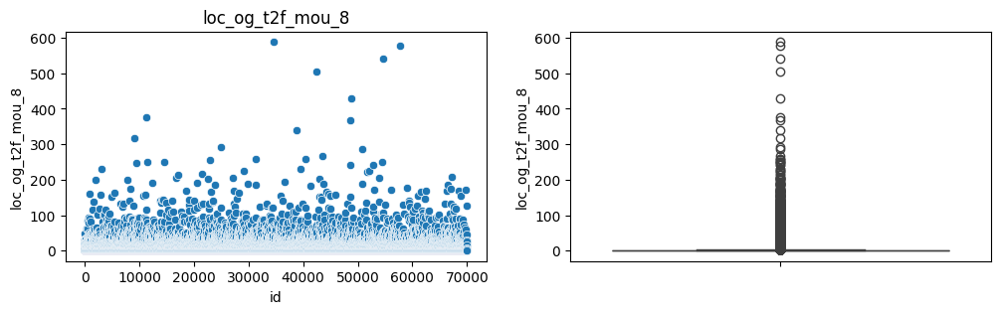

---------------------------------------------------------------------------
loc_og_t2c_mou_6
unique vaules =  1945


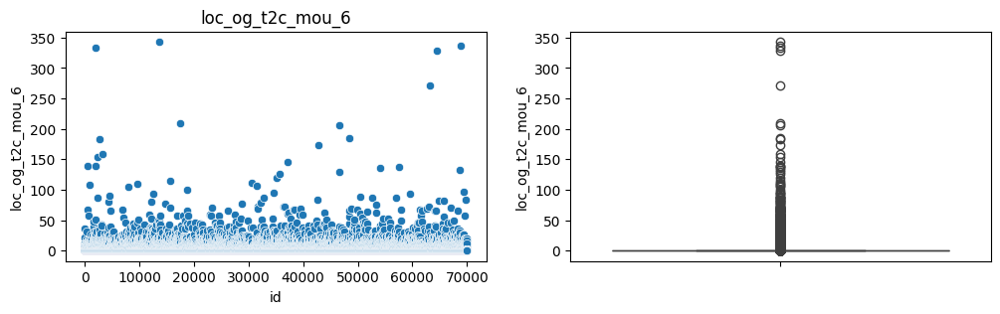

---------------------------------------------------------------------------
loc_og_t2c_mou_7
unique vaules =  2103


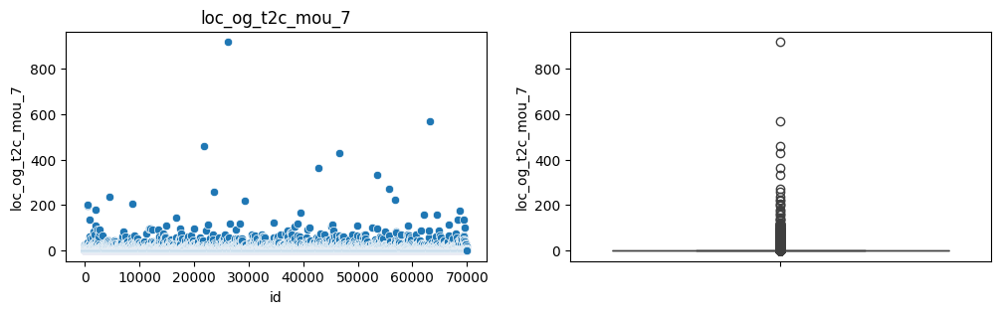

---------------------------------------------------------------------------
loc_og_t2c_mou_8
unique vaules =  2204


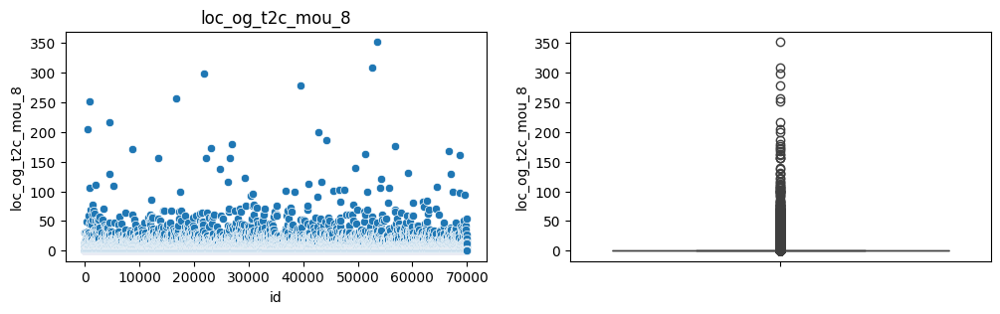

---------------------------------------------------------------------------
loc_og_mou_6
unique vaules =  22309


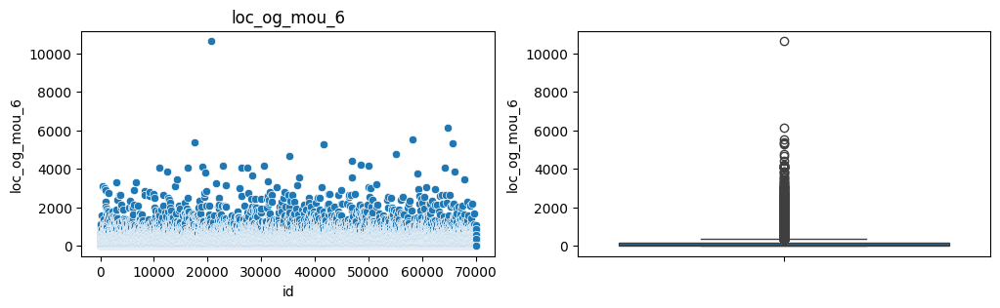

---------------------------------------------------------------------------
loc_og_mou_7
unique vaules =  22012


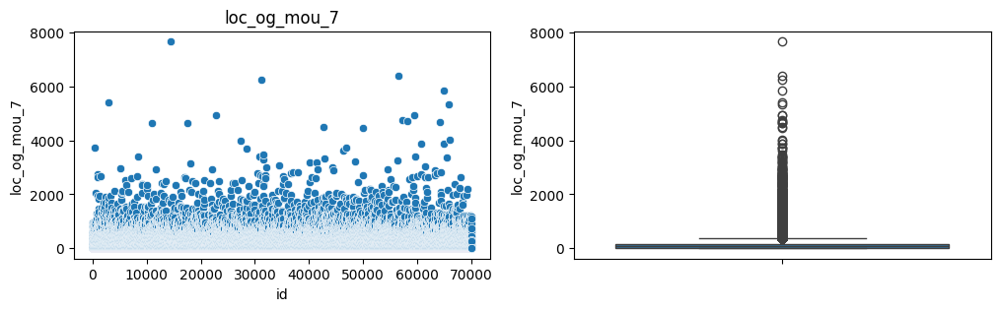

---------------------------------------------------------------------------
loc_og_mou_8
unique vaules =  21951


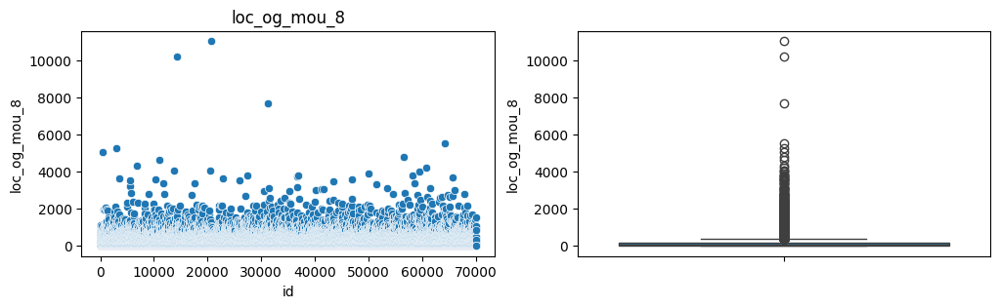

---------------------------------------------------------------------------
std_og_t2t_mou_6
unique vaules =  14554


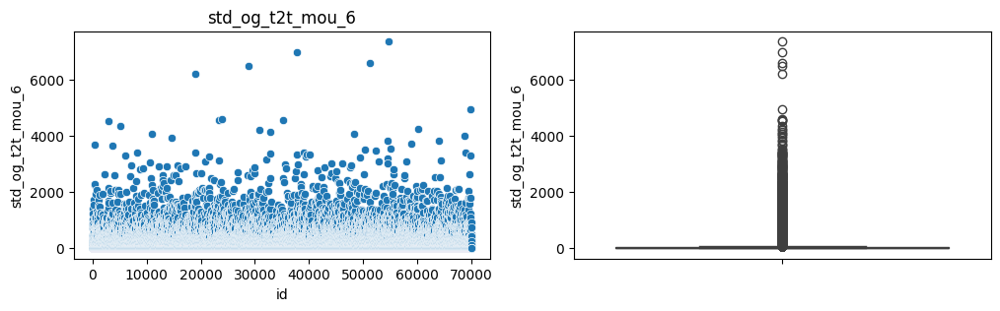

---------------------------------------------------------------------------
std_og_t2t_mou_7
unique vaules =  14745


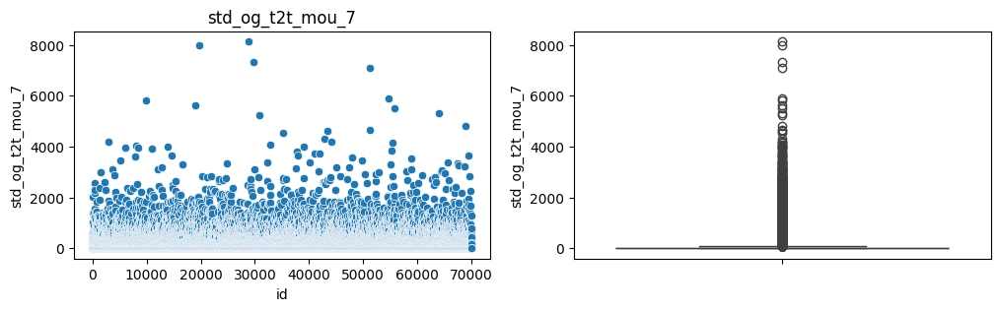

---------------------------------------------------------------------------
std_og_t2t_mou_8
unique vaules =  14483


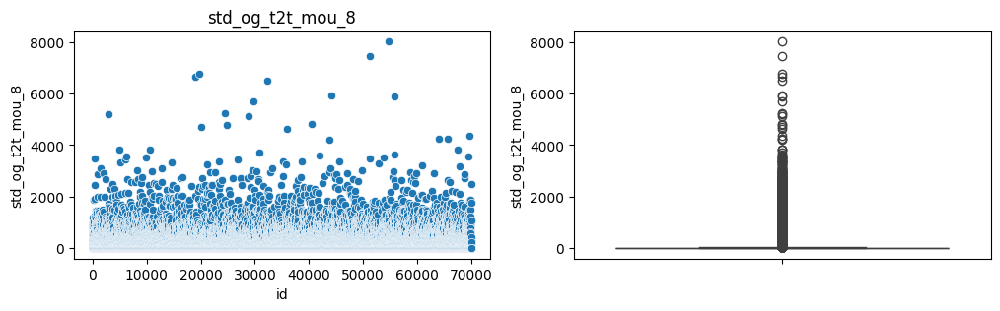

---------------------------------------------------------------------------
std_og_t2m_mou_6
unique vaules =  16059


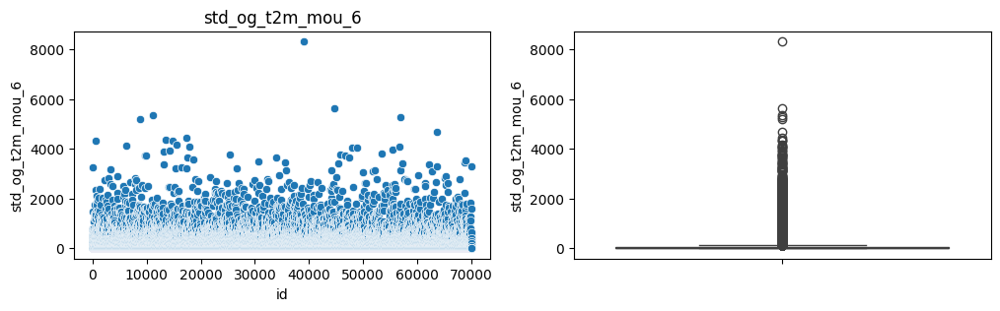

---------------------------------------------------------------------------
std_og_t2m_mou_7
unique vaules =  16234


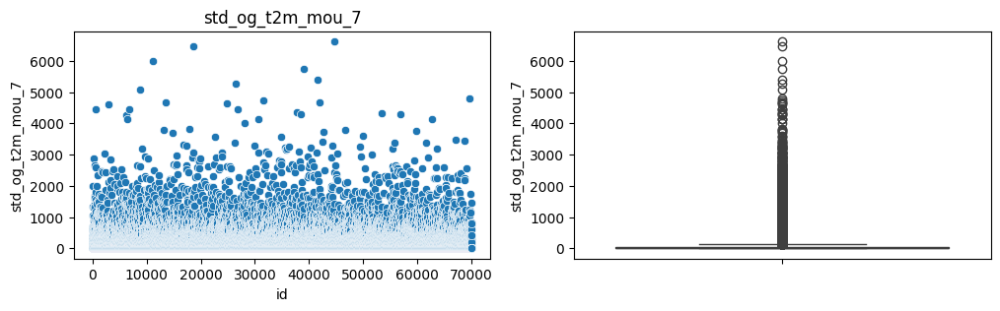

---------------------------------------------------------------------------
std_og_t2m_mou_8
unique vaules =  15968


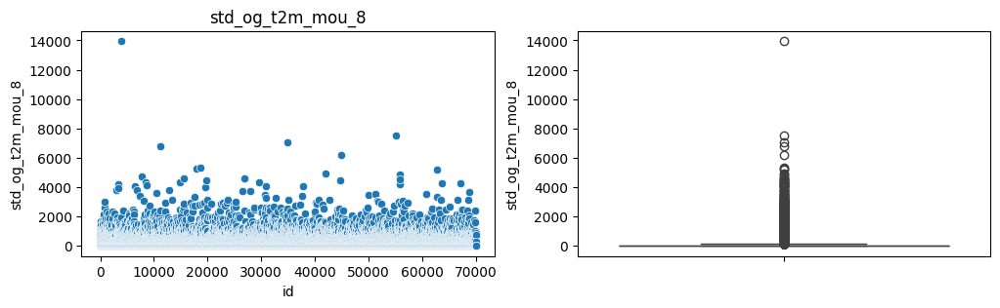

---------------------------------------------------------------------------
std_og_t2f_mou_6
unique vaules =  2074


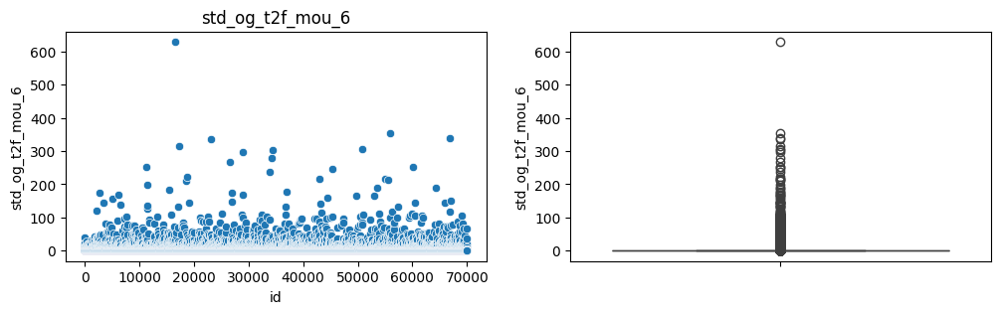

---------------------------------------------------------------------------
std_og_t2f_mou_7
unique vaules =  1991


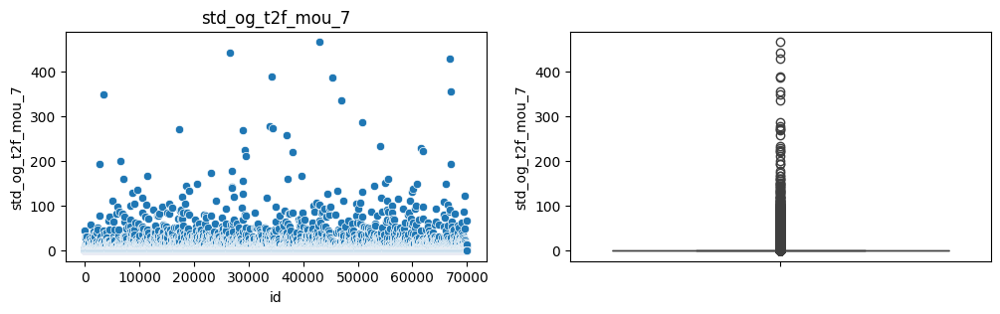

---------------------------------------------------------------------------
std_og_t2f_mou_8
unique vaules =  1945


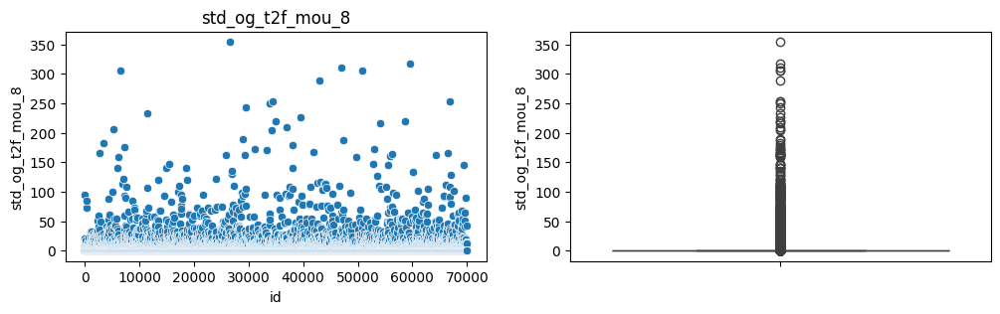

---------------------------------------------------------------------------
std_og_mou_6
unique vaules =  21837


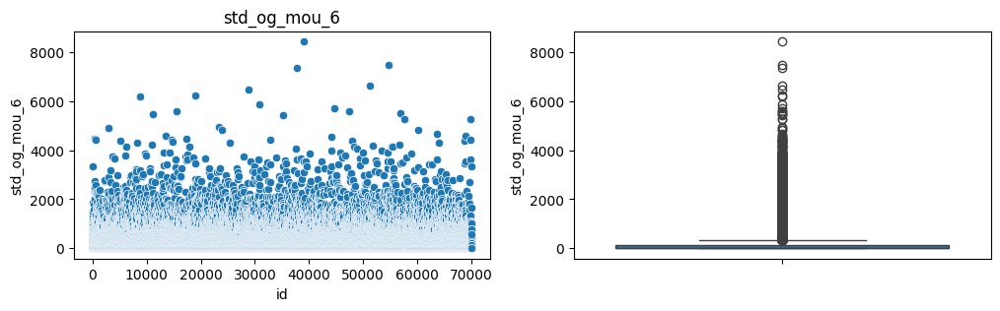

---------------------------------------------------------------------------
std_og_mou_7
unique vaules =  22088


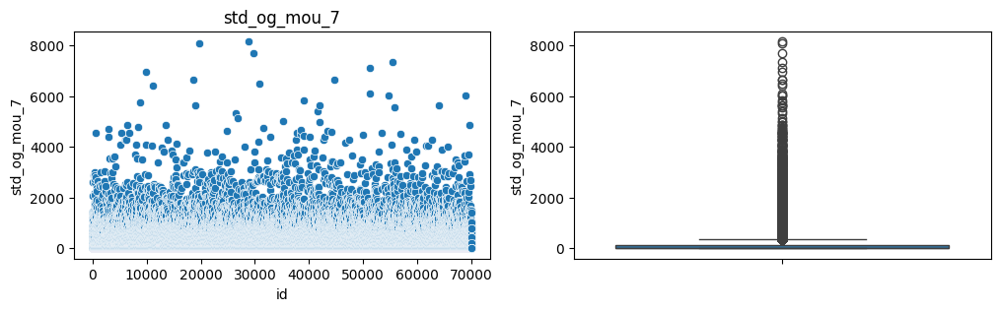

---------------------------------------------------------------------------
std_og_mou_8
unique vaules =  21746


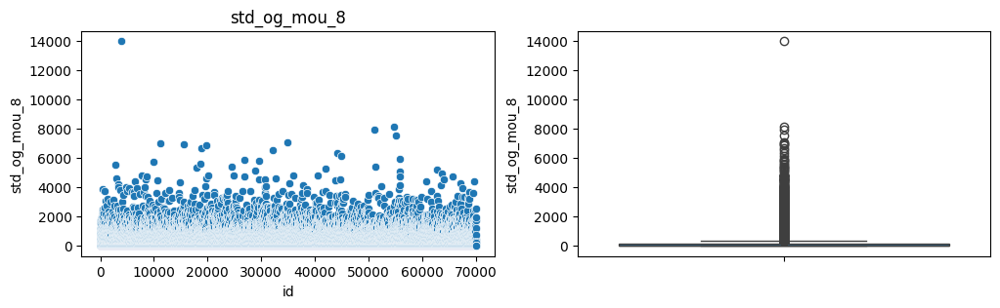

---------------------------------------------------------------------------
isd_og_mou_6
unique vaules =  1103


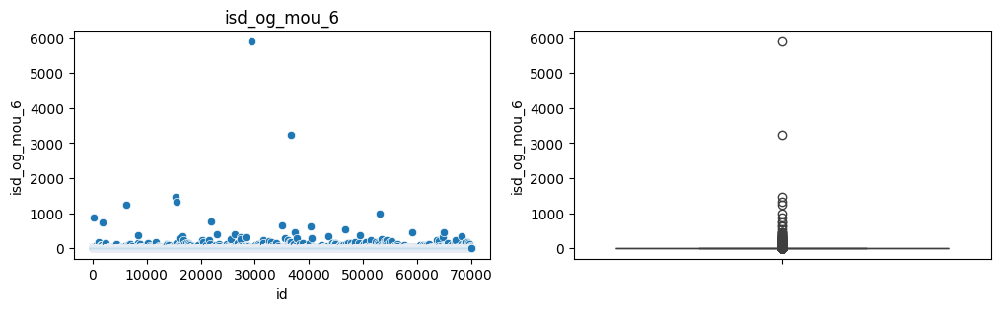

---------------------------------------------------------------------------
isd_og_mou_7
unique vaules =  1084


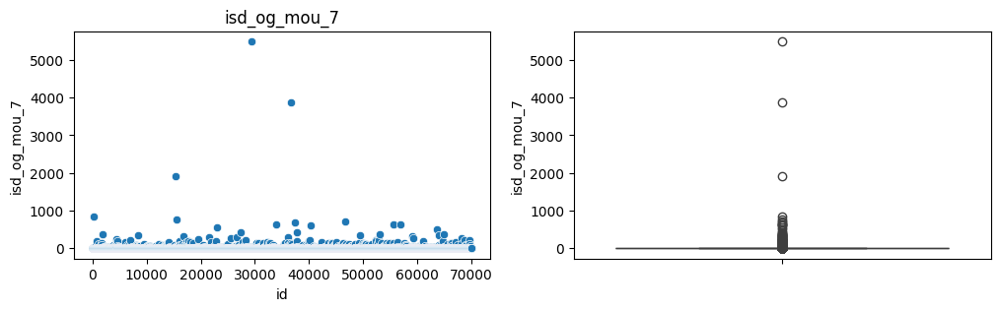

---------------------------------------------------------------------------
isd_og_mou_8
unique vaules =  1008


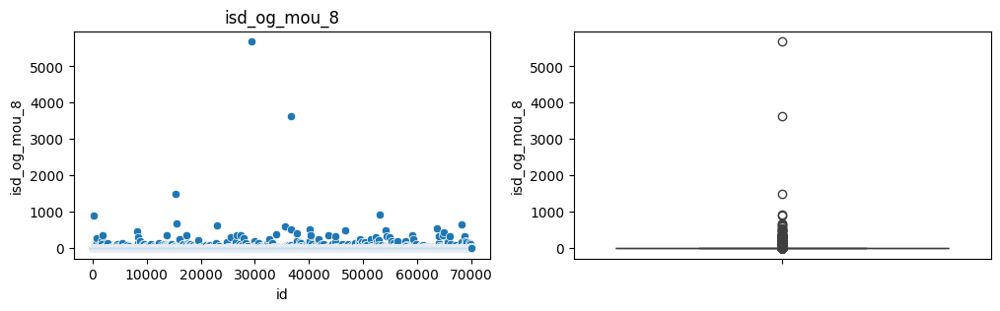

---------------------------------------------------------------------------
spl_og_mou_6
unique vaules =  3503


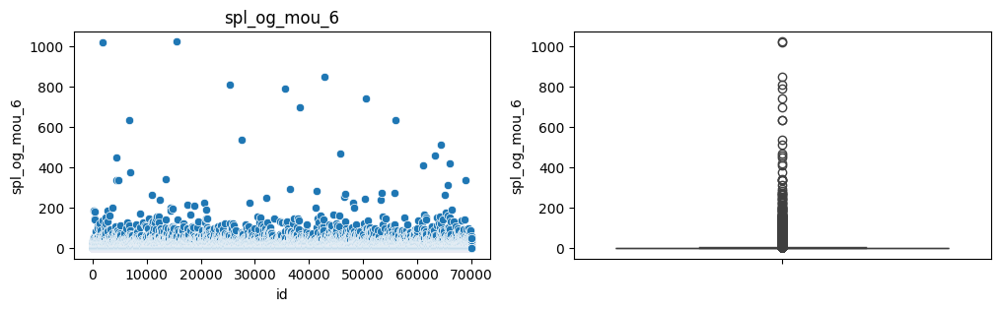

---------------------------------------------------------------------------
spl_og_mou_7
unique vaules =  3827


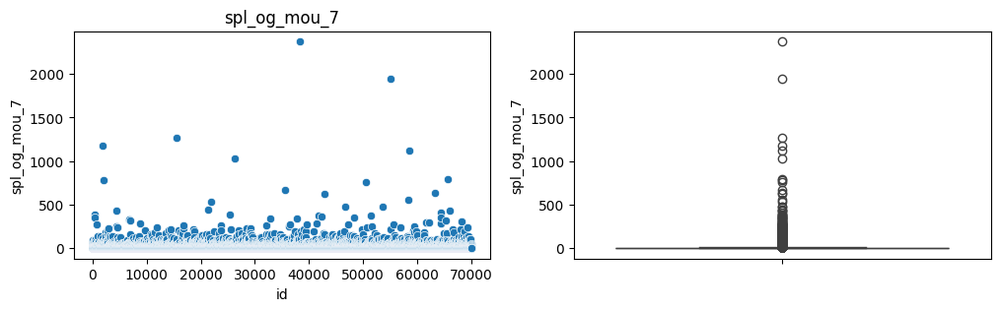

---------------------------------------------------------------------------
spl_og_mou_8
unique vaules =  3848


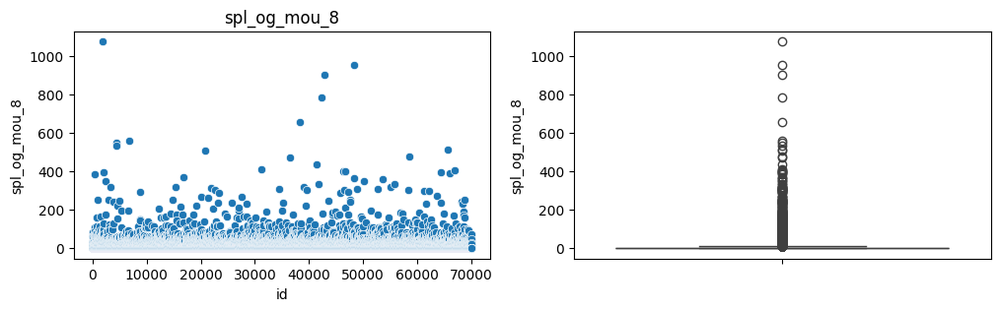

---------------------------------------------------------------------------
og_others_6
unique vaules =  914


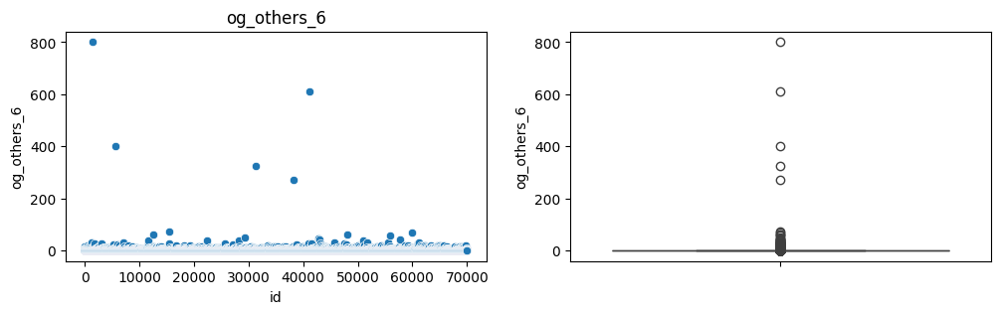

---------------------------------------------------------------------------
og_others_7
unique vaules =  148


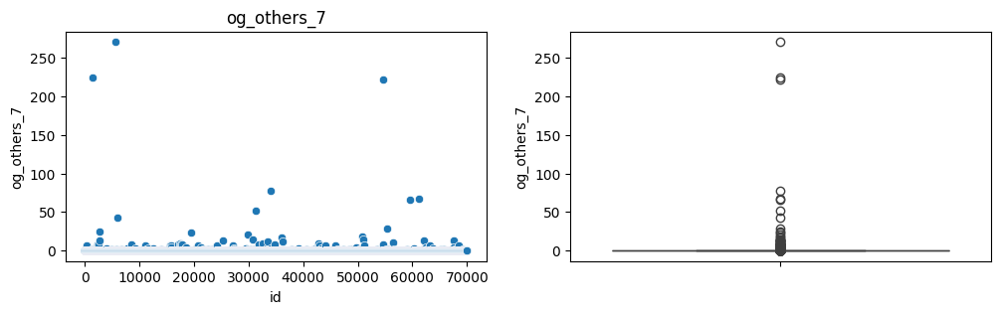

---------------------------------------------------------------------------
og_others_8
unique vaules =  179


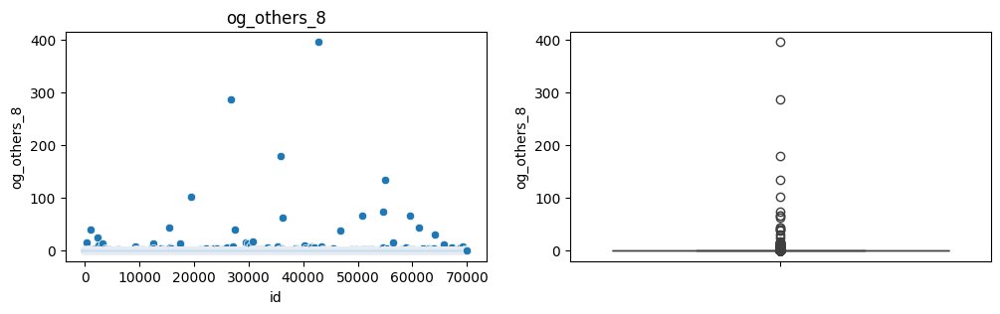

---------------------------------------------------------------------------
total_og_mou_6
unique vaules =  33135


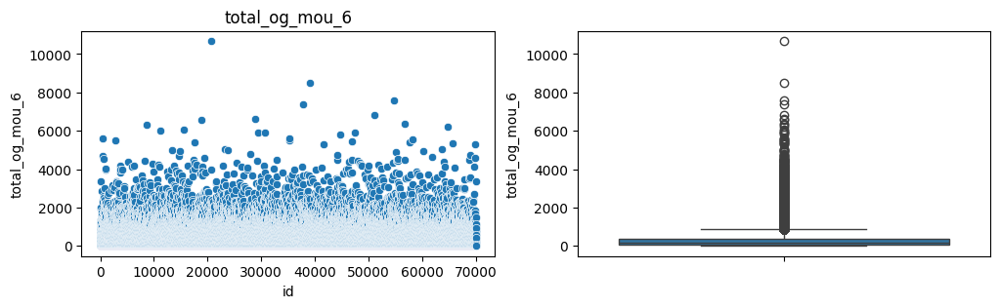

---------------------------------------------------------------------------
total_og_mou_7
unique vaules =  33195


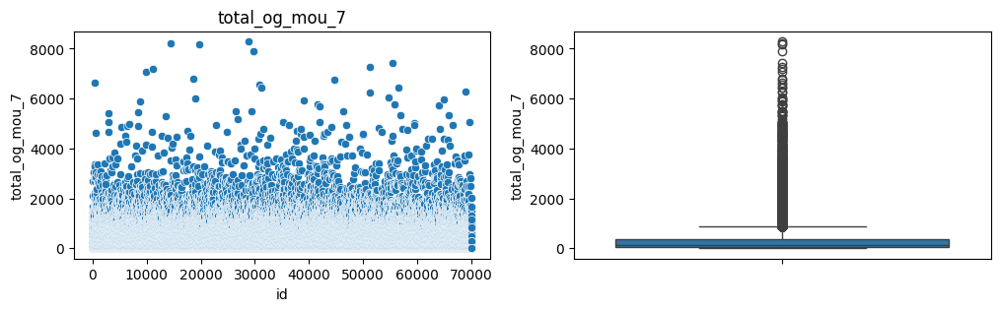

---------------------------------------------------------------------------
total_og_mou_8
unique vaules =  32897


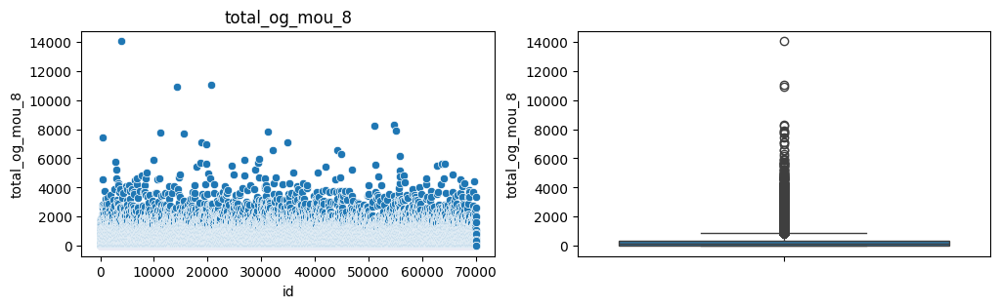

---------------------------------------------------------------------------
loc_ic_t2t_mou_6
unique vaules =  11637


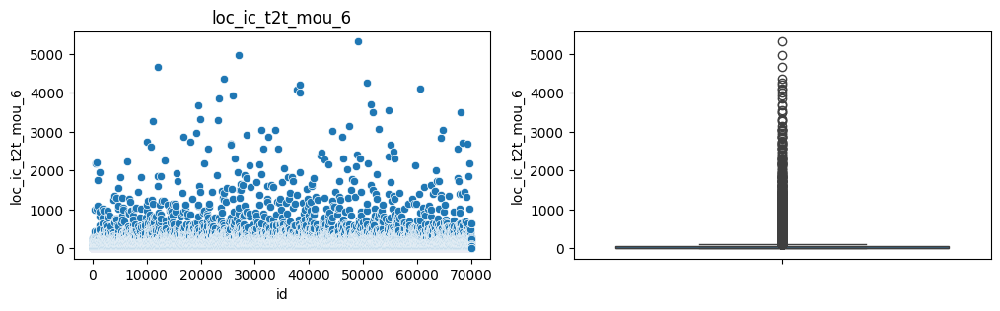

---------------------------------------------------------------------------
loc_ic_t2t_mou_7
unique vaules =  11595


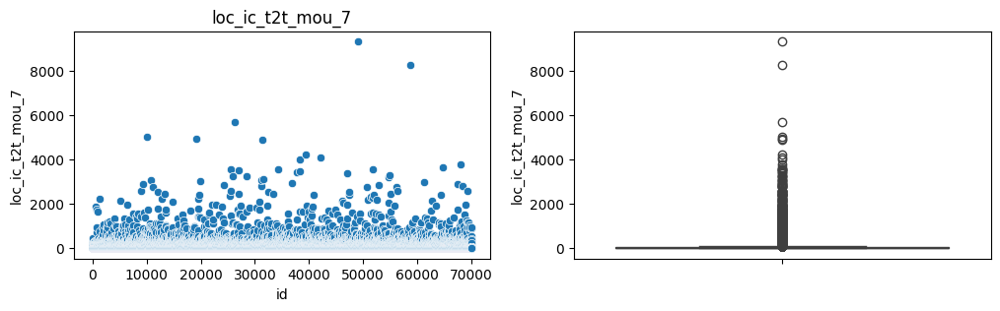

---------------------------------------------------------------------------
loc_ic_t2t_mou_8
unique vaules =  11446


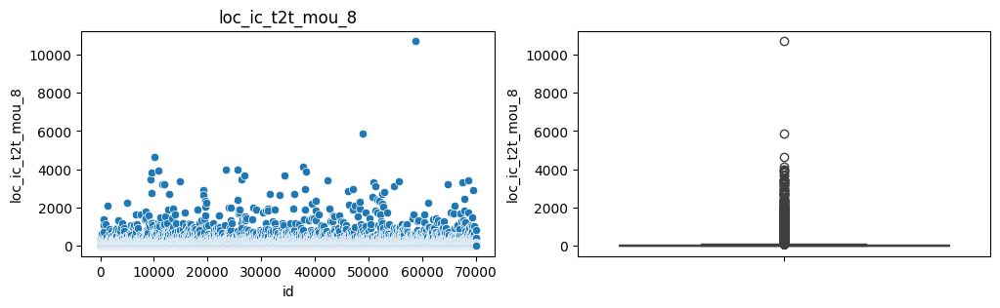

---------------------------------------------------------------------------
loc_ic_t2m_mou_6
unique vaules =  19034


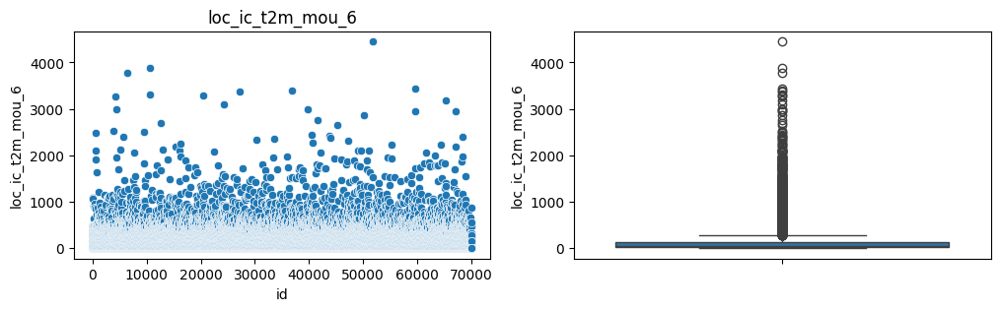

---------------------------------------------------------------------------
loc_ic_t2m_mou_7
unique vaules =  18945


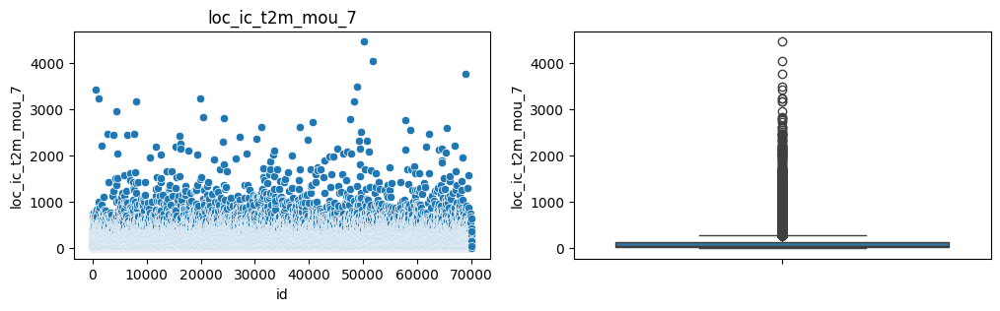

---------------------------------------------------------------------------
loc_ic_t2m_mou_8
unique vaules =  19022


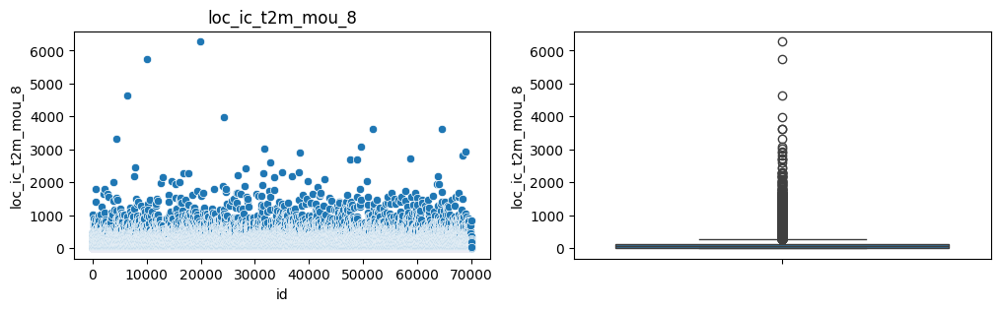

---------------------------------------------------------------------------
loc_ic_t2f_mou_6
unique vaules =  6200


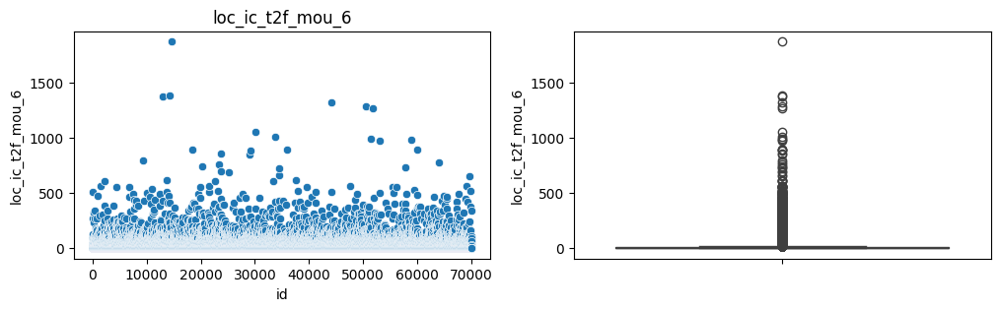

---------------------------------------------------------------------------
loc_ic_t2f_mou_7
unique vaules =  6287


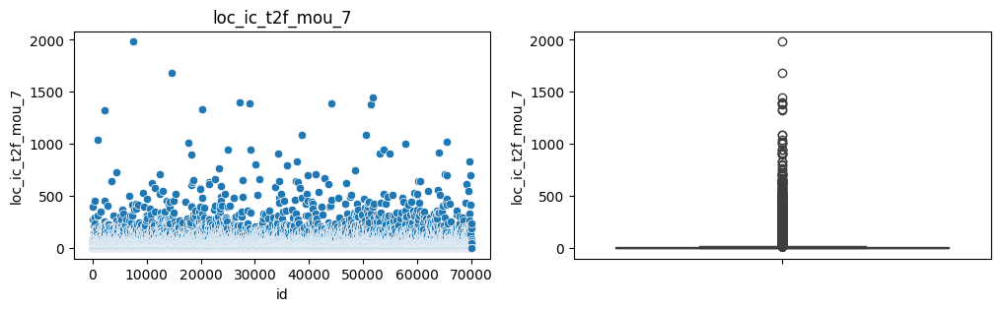

---------------------------------------------------------------------------
loc_ic_t2f_mou_8
unique vaules =  6092


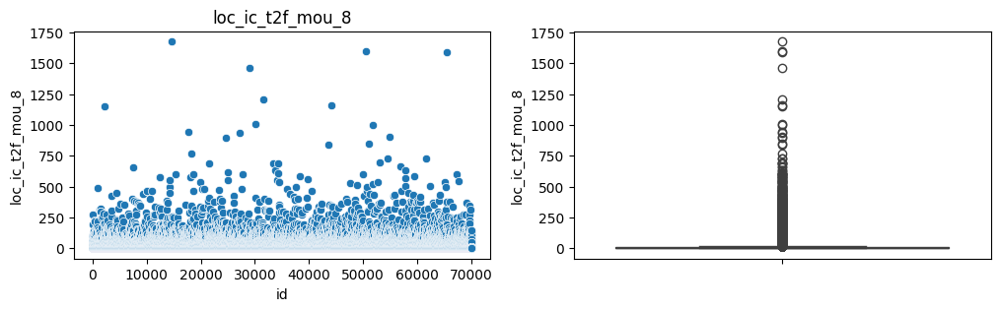

---------------------------------------------------------------------------
loc_ic_mou_6
unique vaules =  24442


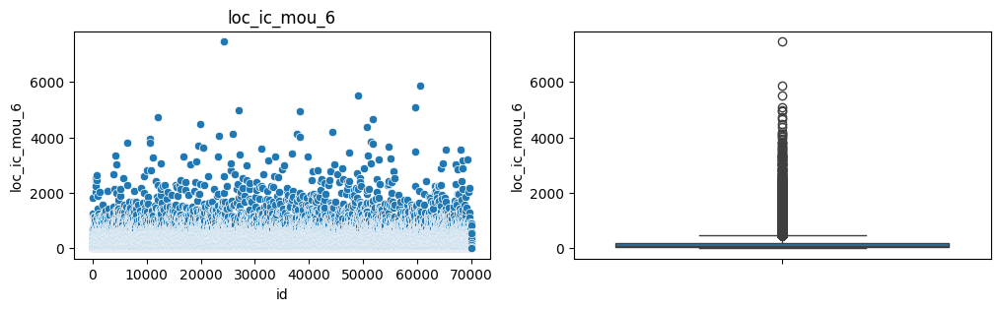

---------------------------------------------------------------------------
loc_ic_mou_7
unique vaules =  24258


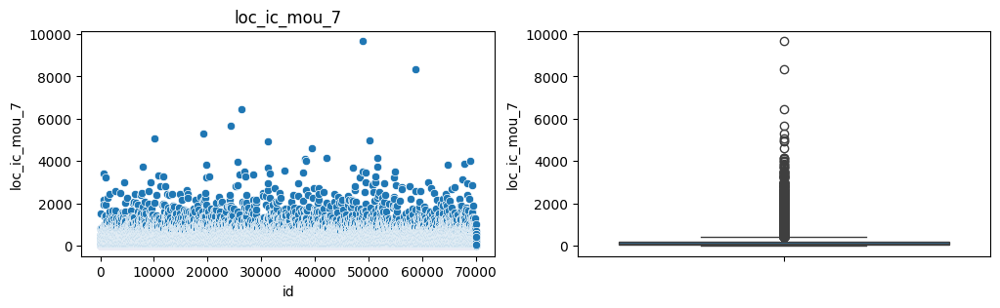

---------------------------------------------------------------------------
loc_ic_mou_8
unique vaules =  24182


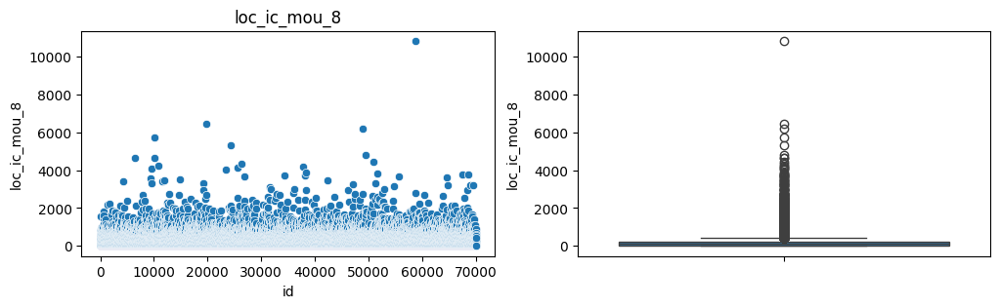

---------------------------------------------------------------------------
std_ic_t2t_mou_6
unique vaules =  5323


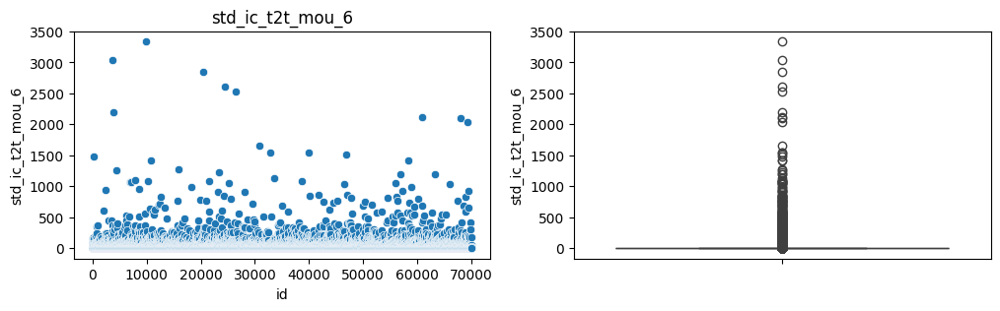

---------------------------------------------------------------------------
std_ic_t2t_mou_7
unique vaules =  5479


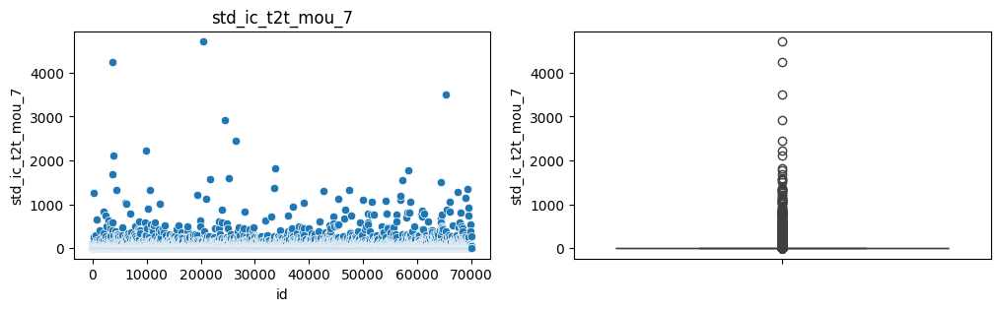

---------------------------------------------------------------------------
std_ic_t2t_mou_8
unique vaules =  5367


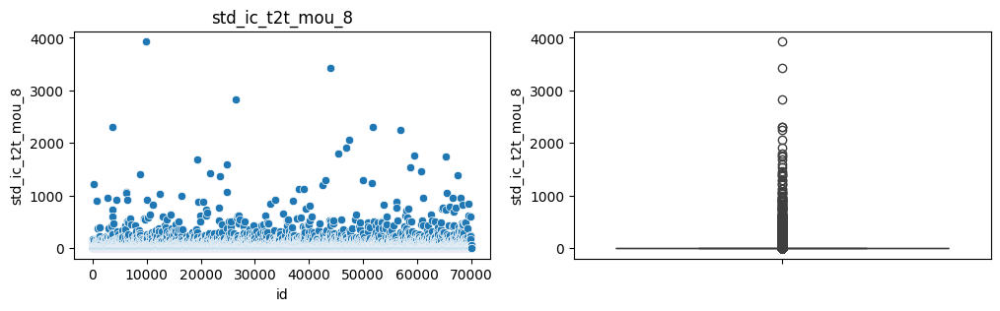

---------------------------------------------------------------------------
std_ic_t2m_mou_6
unique vaules =  7931


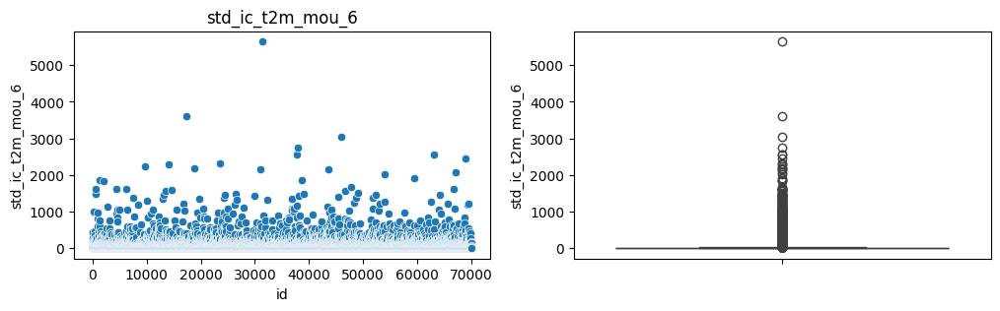

---------------------------------------------------------------------------
std_ic_t2m_mou_7
unique vaules =  8033


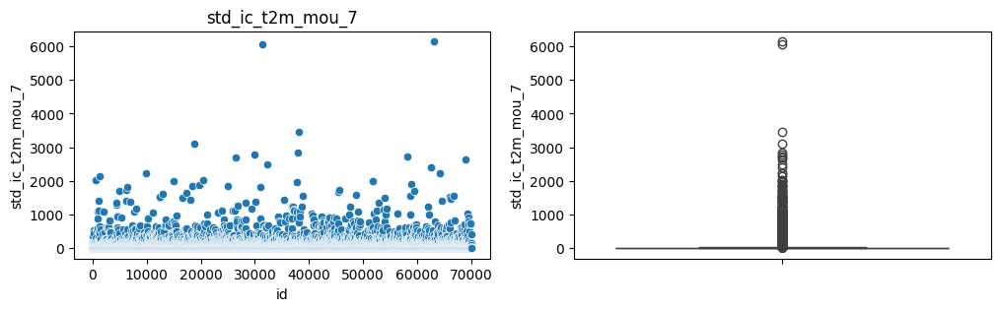

---------------------------------------------------------------------------
std_ic_t2m_mou_8
unique vaules =  7906


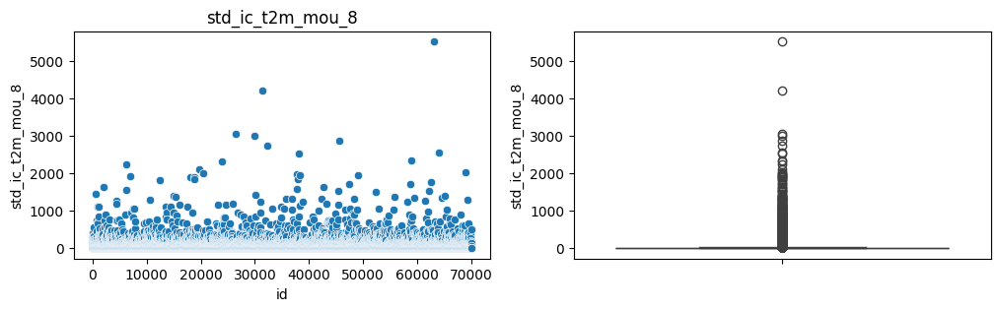

---------------------------------------------------------------------------
std_ic_t2f_mou_6
unique vaules =  2624


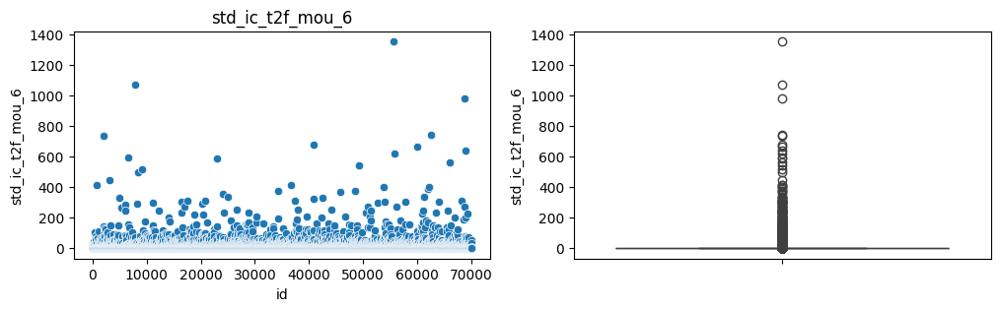

---------------------------------------------------------------------------
std_ic_t2f_mou_7
unique vaules =  2695


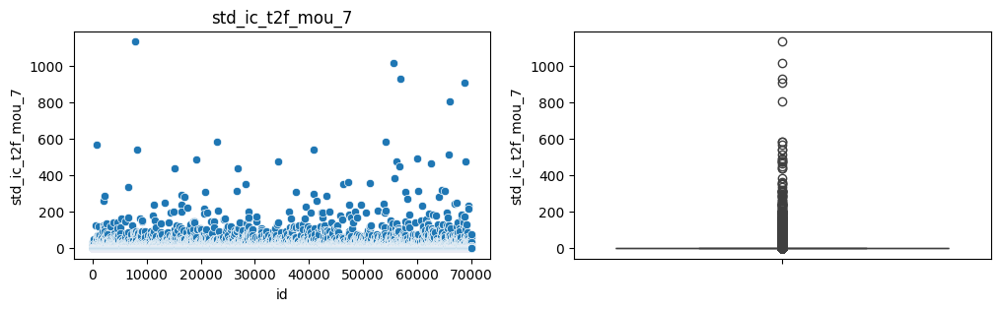

---------------------------------------------------------------------------
std_ic_t2f_mou_8
unique vaules =  2583


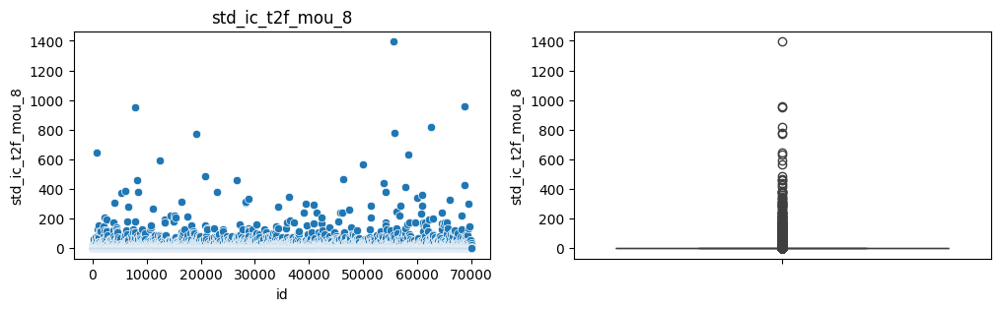

---------------------------------------------------------------------------
std_ic_mou_6
unique vaules =  9876


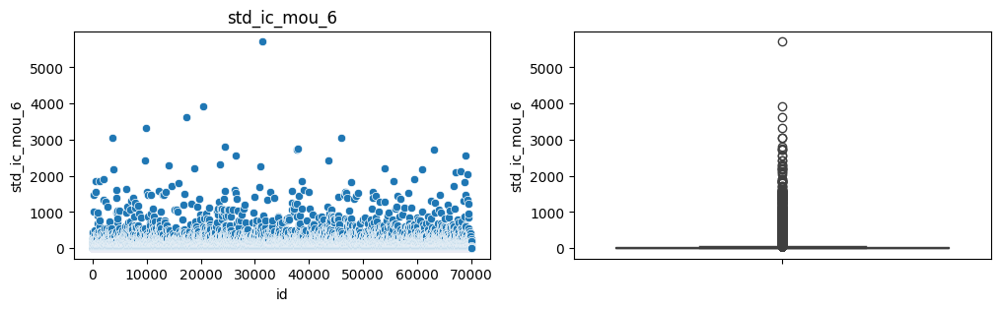

---------------------------------------------------------------------------
std_ic_mou_7
unique vaules =  10112


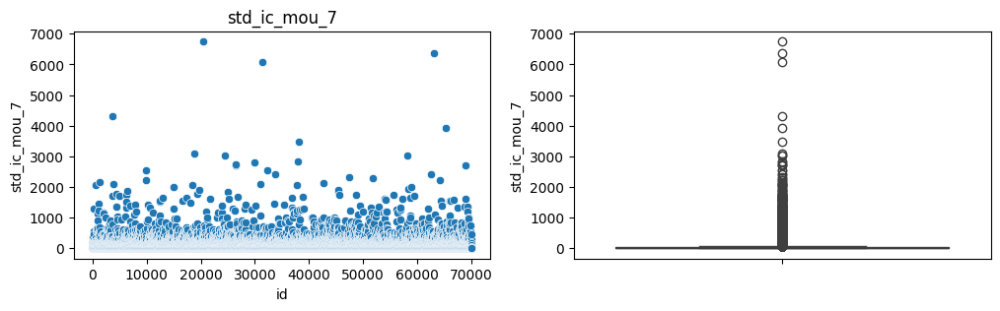

---------------------------------------------------------------------------
std_ic_mou_8
unique vaules =  9939


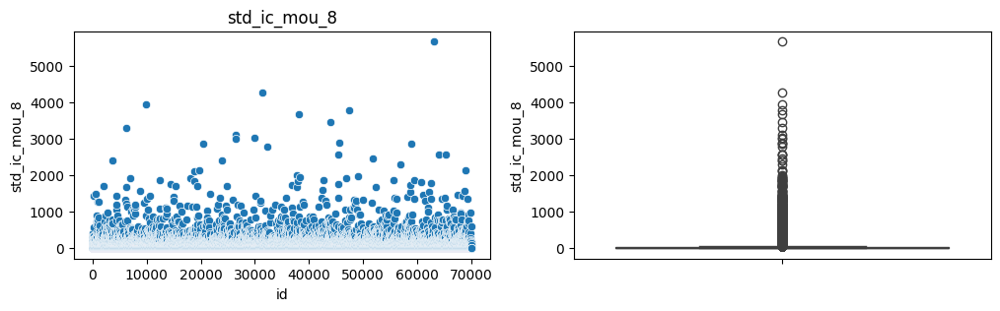

---------------------------------------------------------------------------
total_ic_mou_6
unique vaules =  27432


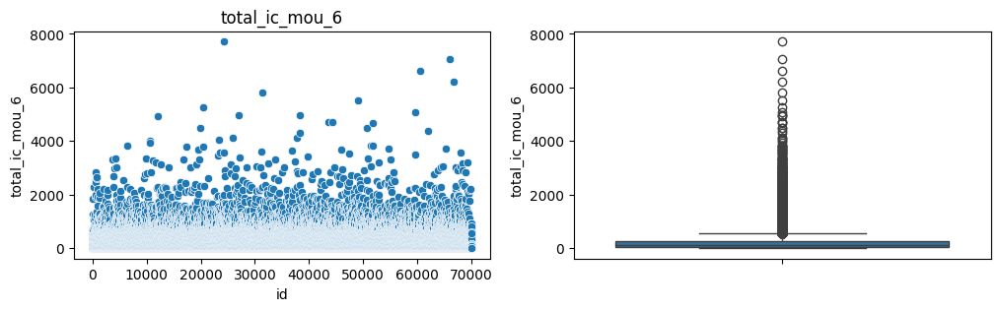

---------------------------------------------------------------------------
total_ic_mou_7
unique vaules =  27418


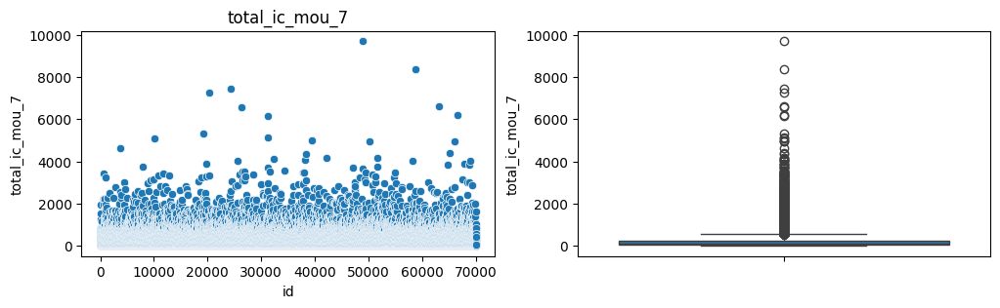

---------------------------------------------------------------------------
total_ic_mou_8
unique vaules =  27318


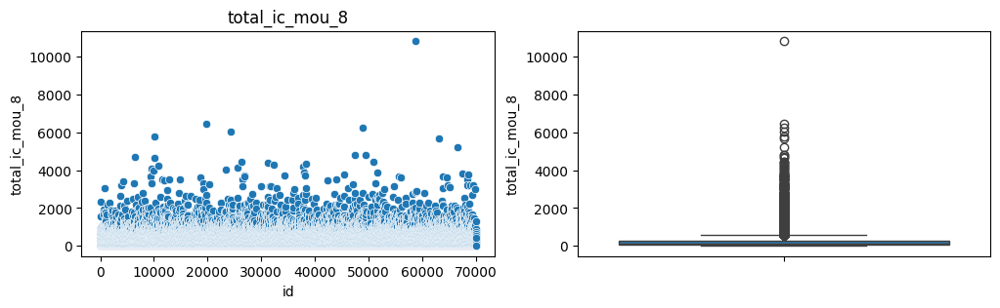

---------------------------------------------------------------------------
spl_ic_mou_6
unique vaules =  78


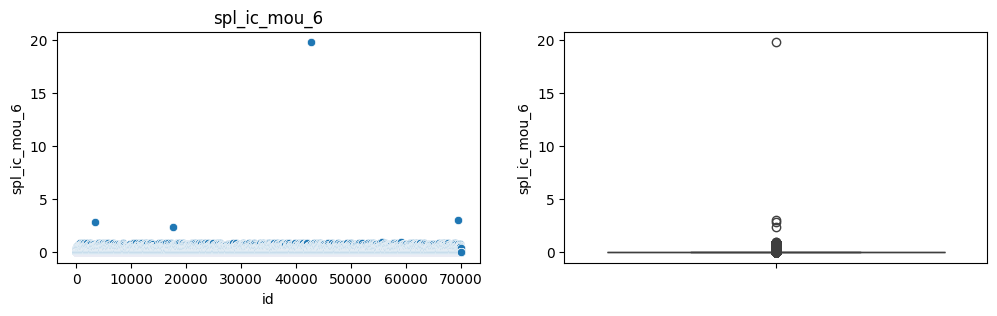

---------------------------------------------------------------------------
spl_ic_mou_7
unique vaules =  103


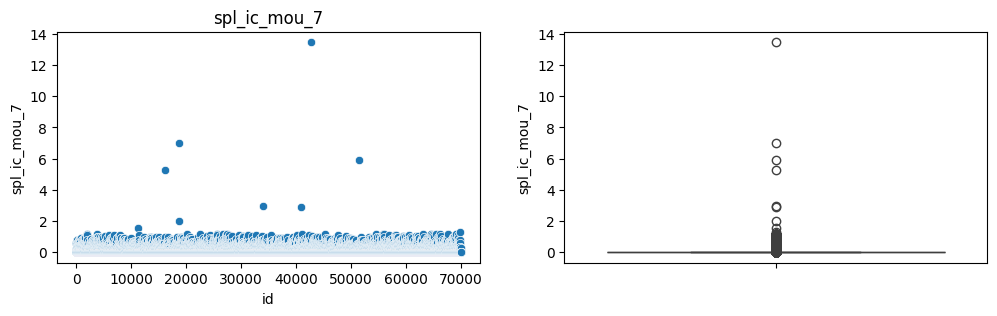

---------------------------------------------------------------------------
spl_ic_mou_8
unique vaules =  95


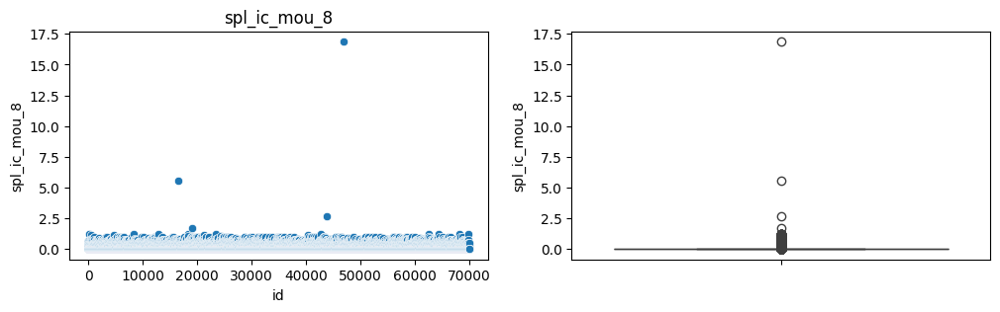

---------------------------------------------------------------------------
isd_ic_mou_6
unique vaules =  4421


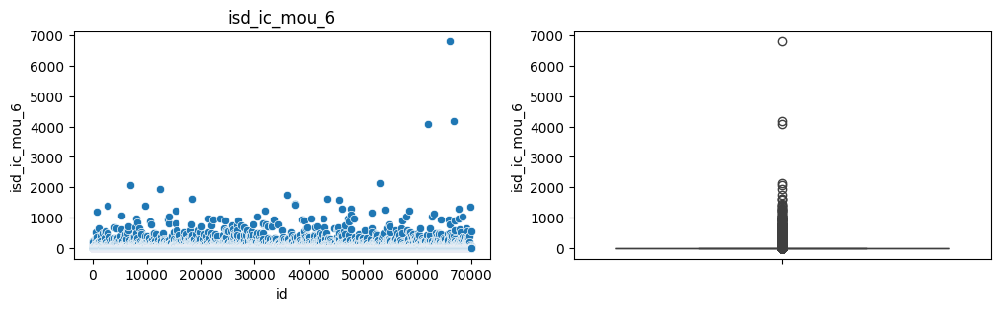

---------------------------------------------------------------------------
isd_ic_mou_7
unique vaules =  4640


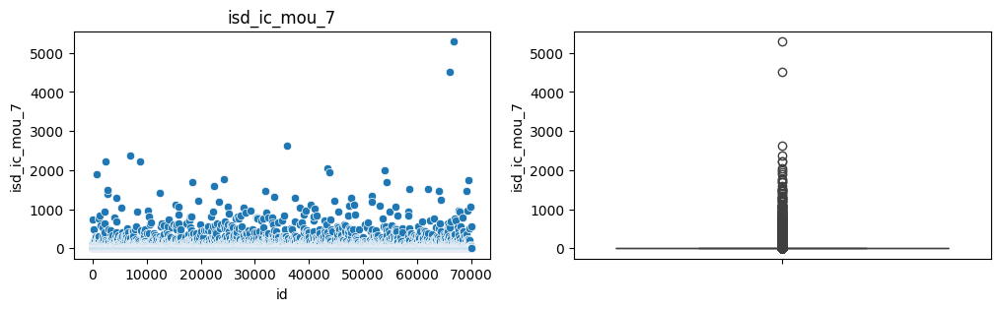

---------------------------------------------------------------------------
isd_ic_mou_8
unique vaules =  4694


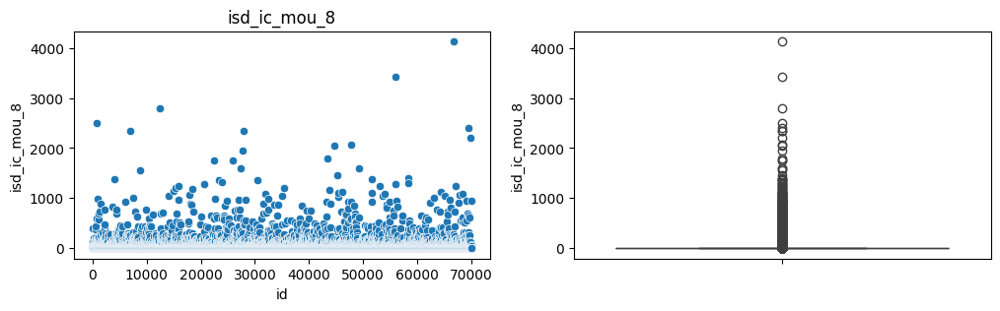

---------------------------------------------------------------------------
ic_others_6
unique vaules =  1523


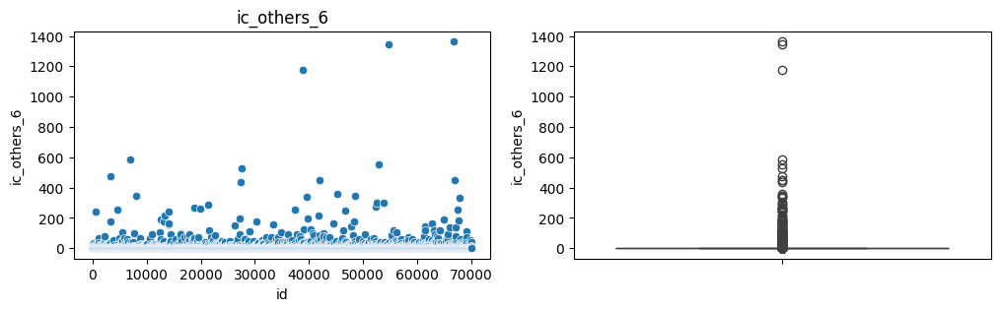

---------------------------------------------------------------------------
ic_others_7
unique vaules =  1658


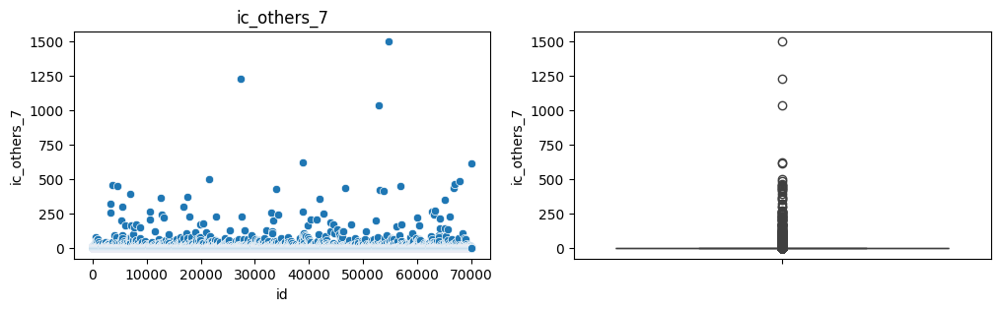

---------------------------------------------------------------------------
ic_others_8
unique vaules =  1565


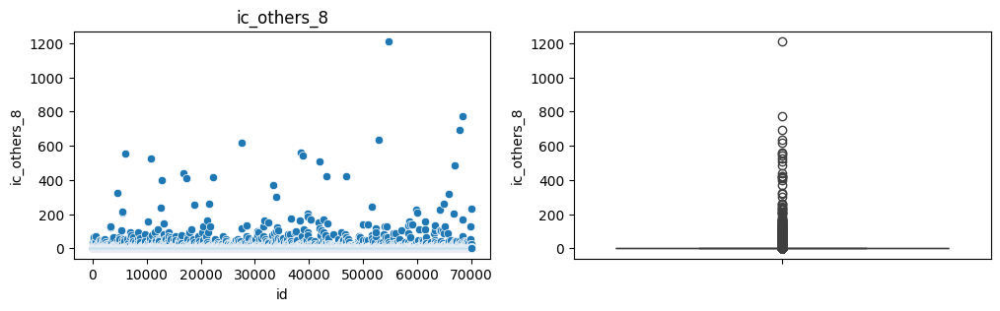

---------------------------------------------------------------------------
total_rech_num_6
unique vaules =  94


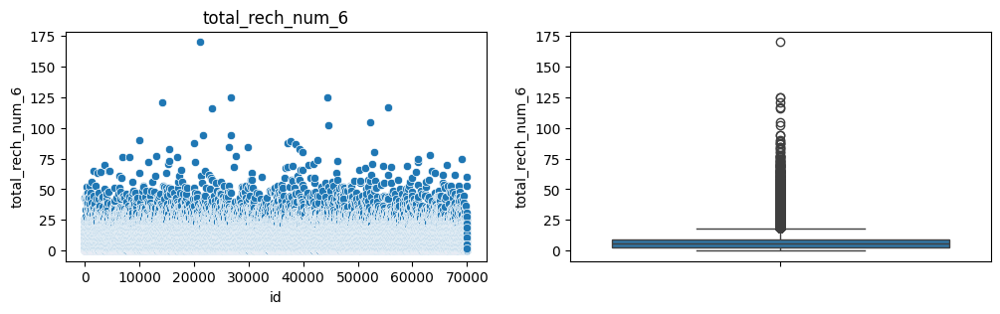

---------------------------------------------------------------------------
total_rech_num_7
unique vaules =  96


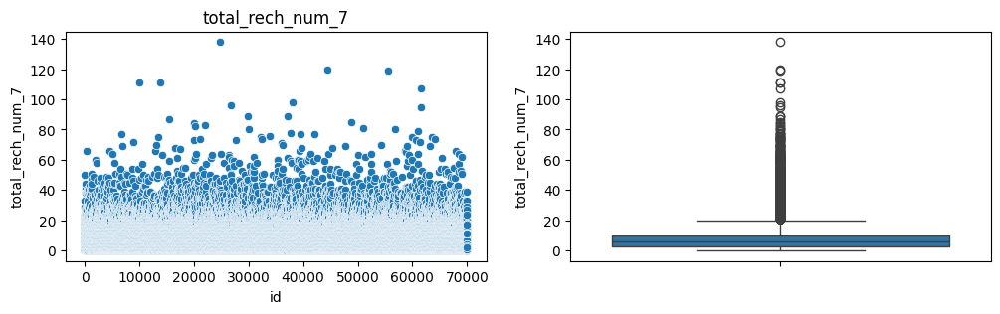

---------------------------------------------------------------------------
total_rech_num_8
unique vaules =  92


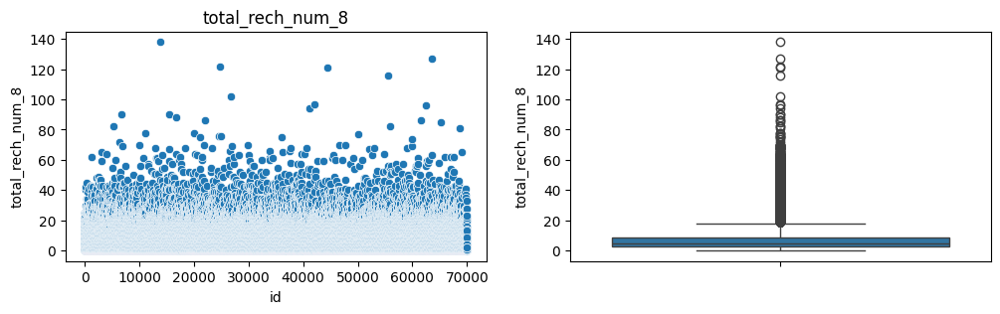

---------------------------------------------------------------------------
total_rech_amt_6
unique vaules =  2108


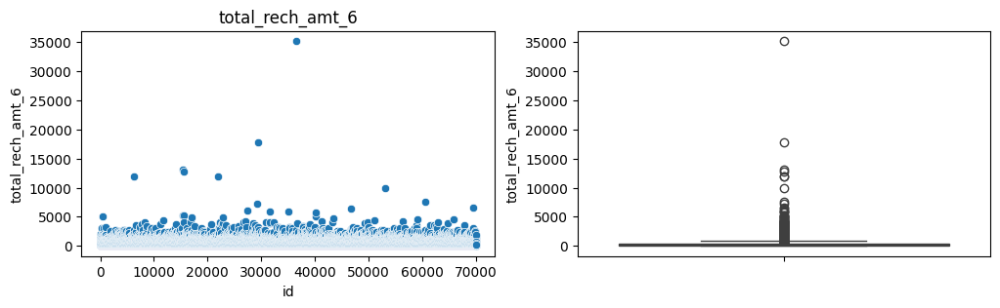

---------------------------------------------------------------------------
total_rech_amt_7
unique vaules =  2147


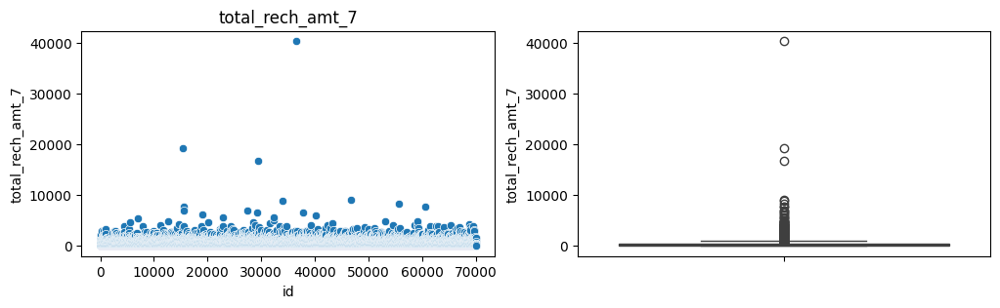

---------------------------------------------------------------------------
total_rech_amt_8
unique vaules =  2149


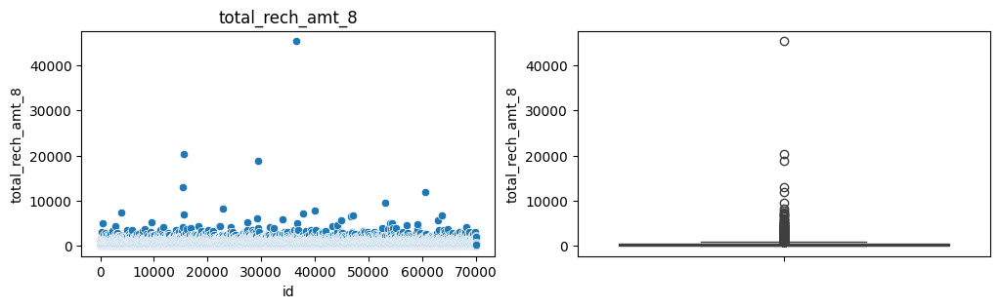

---------------------------------------------------------------------------
max_rech_amt_6
unique vaules =  190


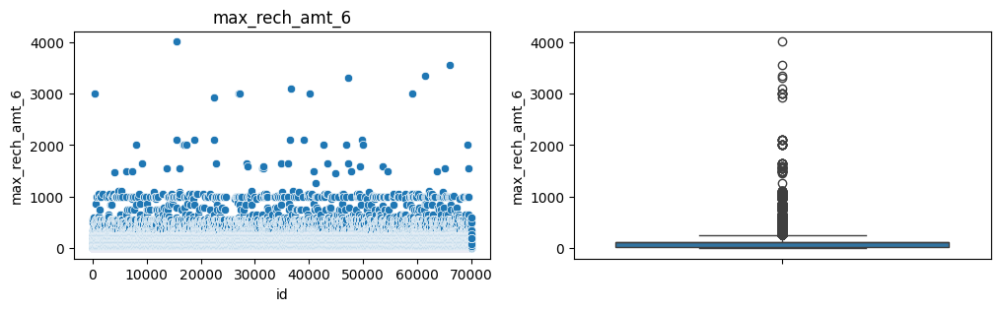

---------------------------------------------------------------------------
max_rech_amt_7
unique vaules =  178


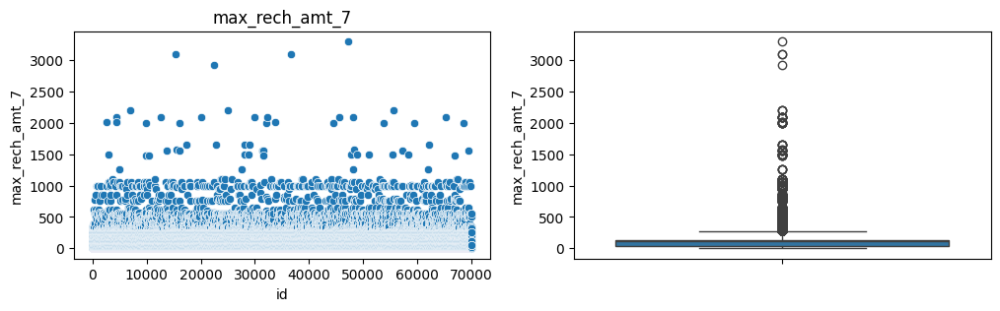

---------------------------------------------------------------------------
max_rech_amt_8
unique vaules =  202


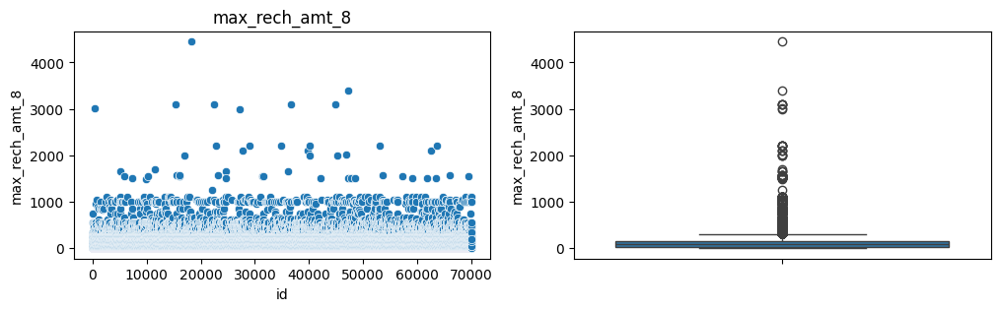

---------------------------------------------------------------------------
last_day_rch_amt_6
unique vaules =  179


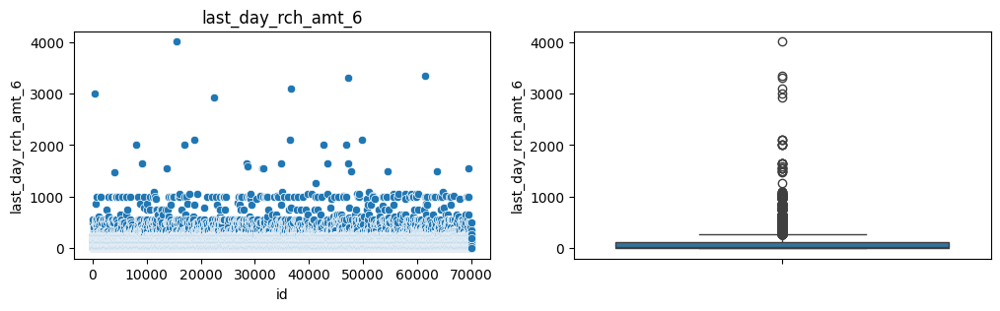

---------------------------------------------------------------------------
last_day_rch_amt_7
unique vaules =  166


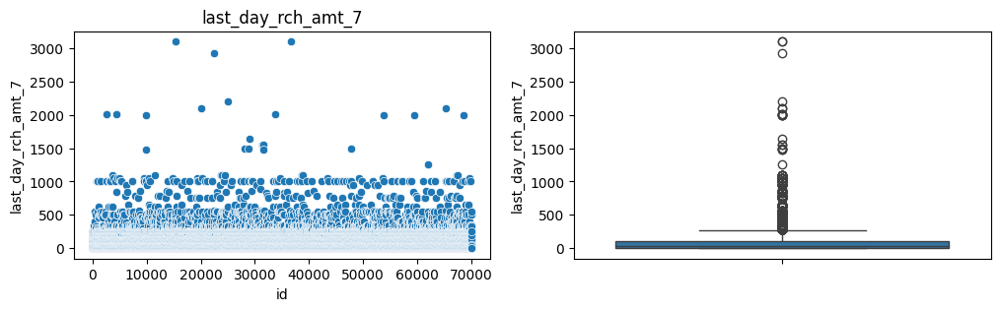

---------------------------------------------------------------------------
last_day_rch_amt_8
unique vaules =  191


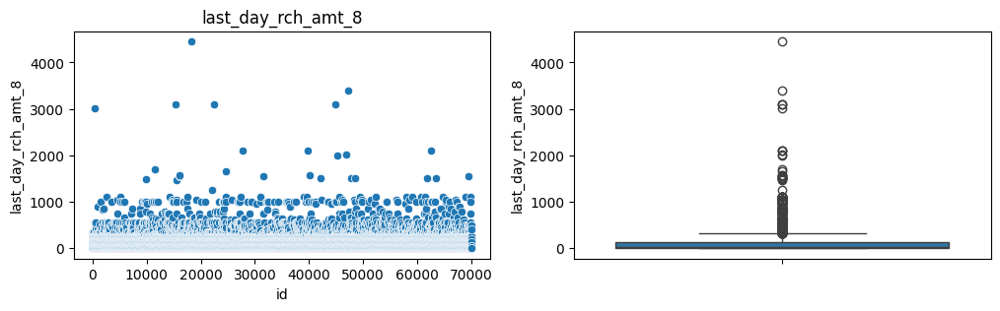

---------------------------------------------------------------------------
vol_2g_mb_6
unique vaules =  11494


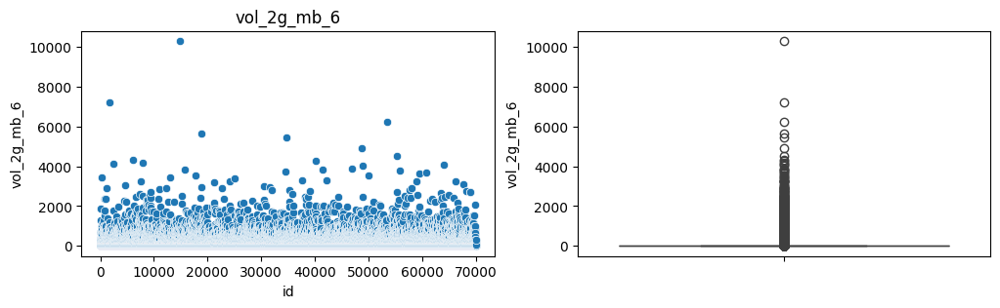

---------------------------------------------------------------------------
vol_2g_mb_7
unique vaules =  11443


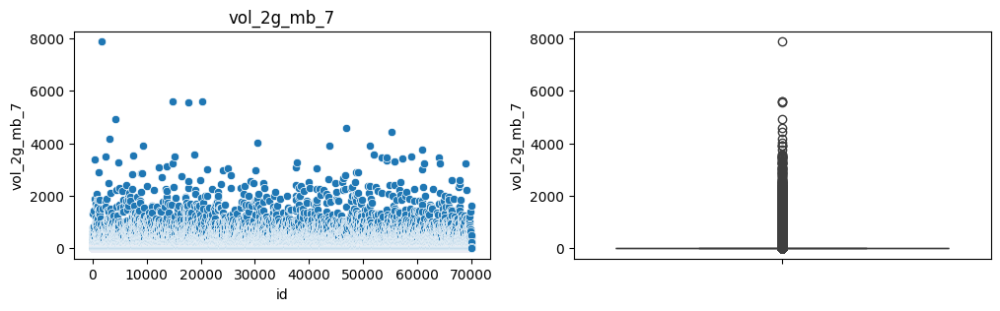

---------------------------------------------------------------------------
vol_2g_mb_8
unique vaules =  11359


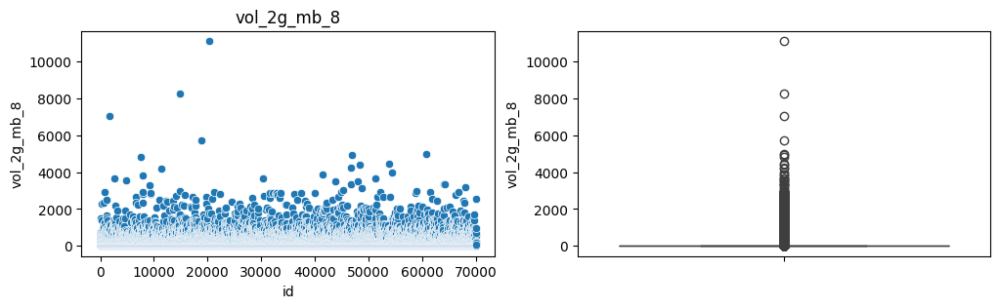

---------------------------------------------------------------------------
vol_3g_mb_6
unique vaules =  9768


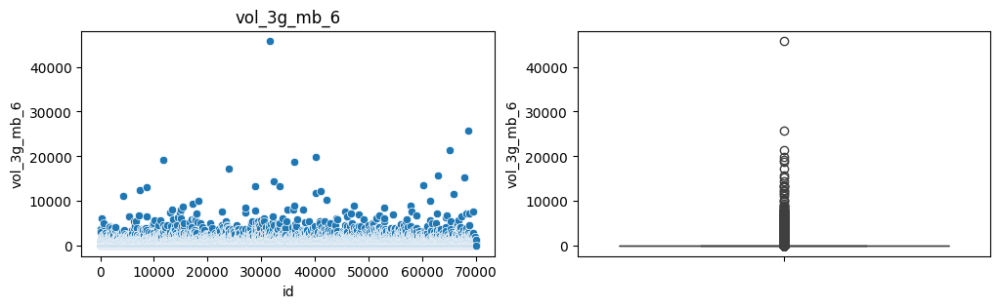

---------------------------------------------------------------------------
vol_3g_mb_7
unique vaules =  10296


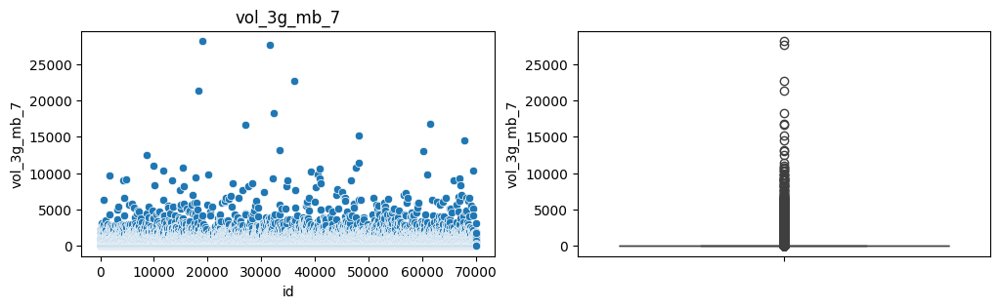

---------------------------------------------------------------------------
vol_3g_mb_8
unique vaules =  10663


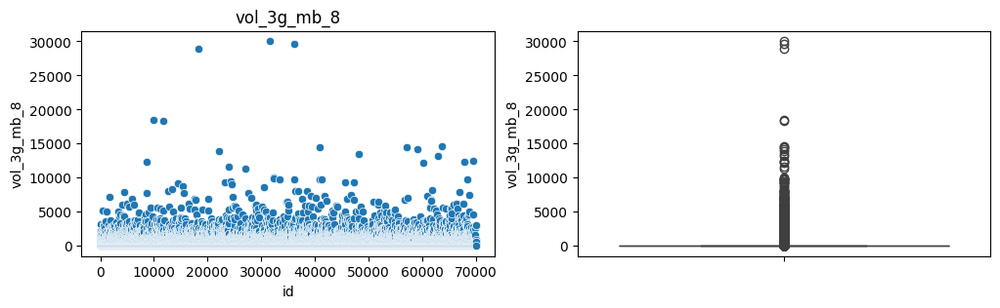

---------------------------------------------------------------------------
monthly_2g_6
unique vaules =  5


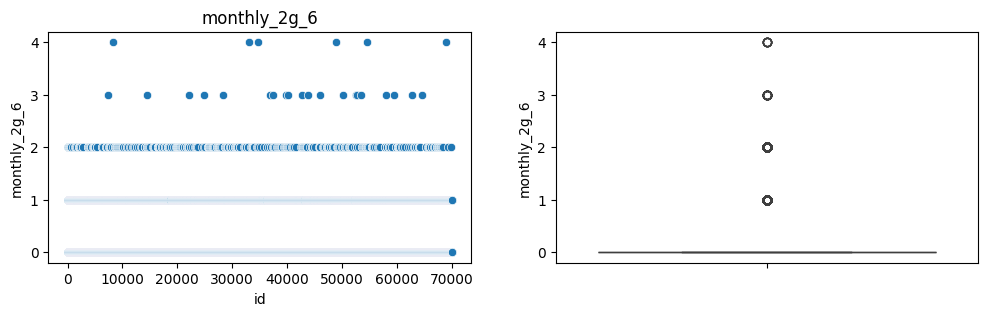

---------------------------------------------------------------------------
monthly_2g_7
unique vaules =  6


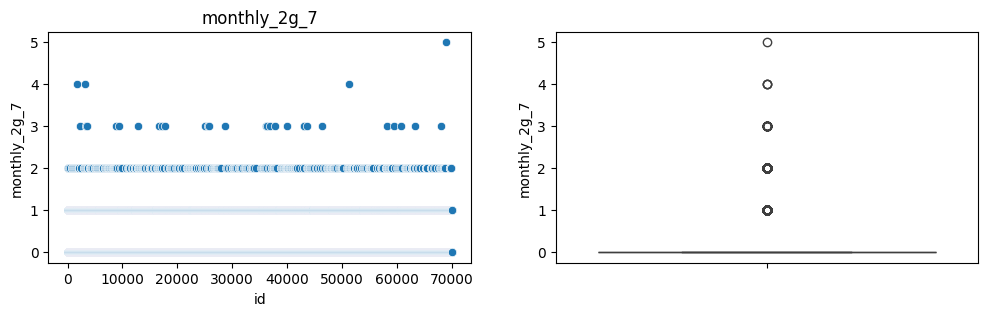

---------------------------------------------------------------------------
monthly_2g_8
unique vaules =  6


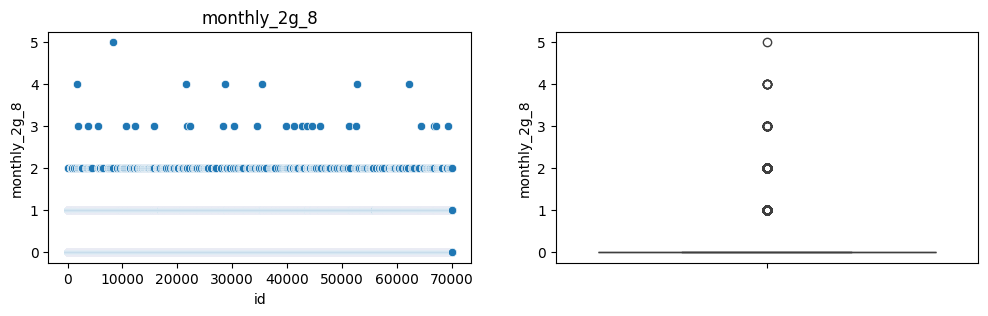

---------------------------------------------------------------------------
sachet_2g_6
unique vaules =  30


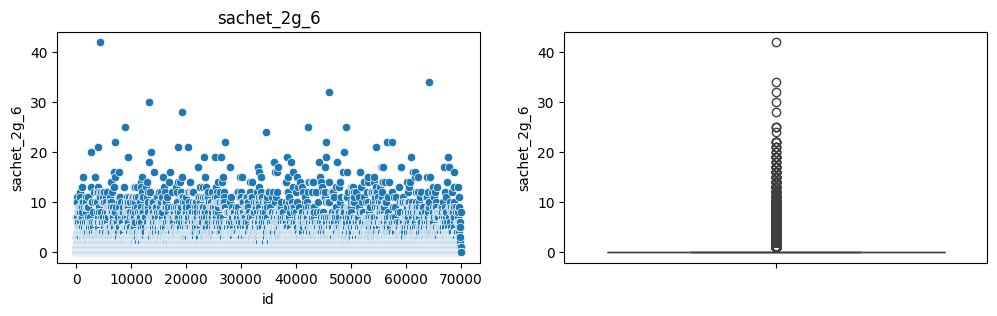

---------------------------------------------------------------------------
sachet_2g_7
unique vaules =  33


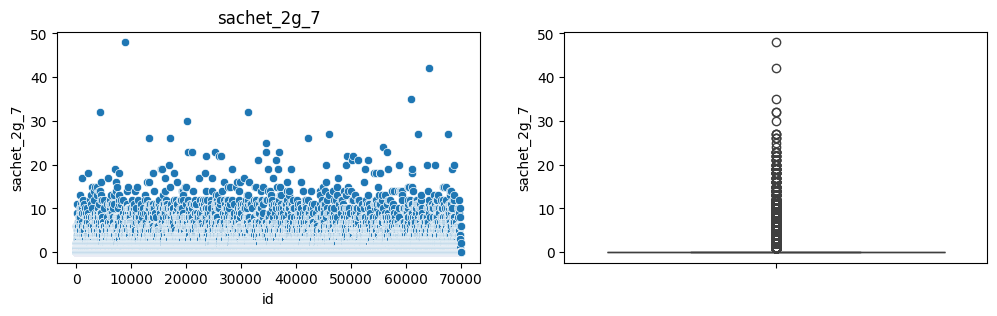

---------------------------------------------------------------------------
sachet_2g_8
unique vaules =  32


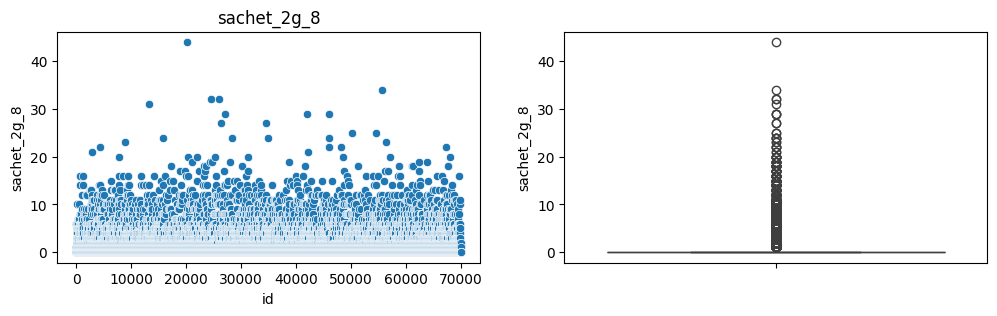

---------------------------------------------------------------------------
monthly_3g_6
unique vaules =  10


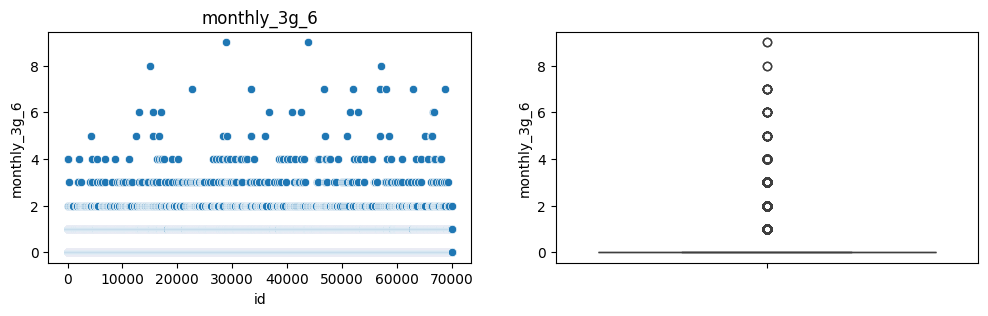

---------------------------------------------------------------------------
monthly_3g_7
unique vaules =  13


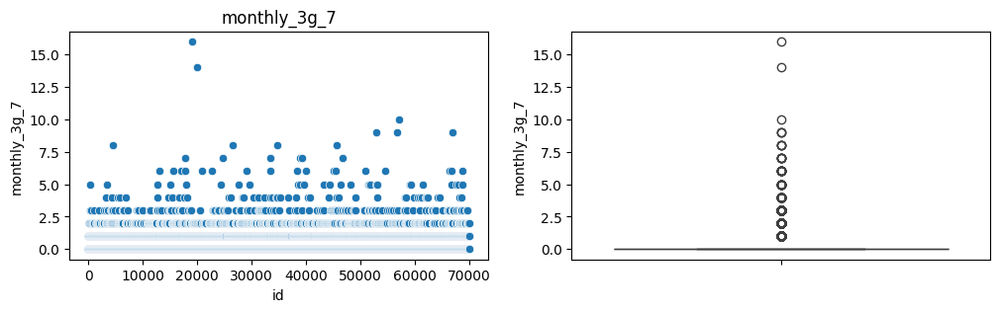

---------------------------------------------------------------------------
monthly_3g_8
unique vaules =  12


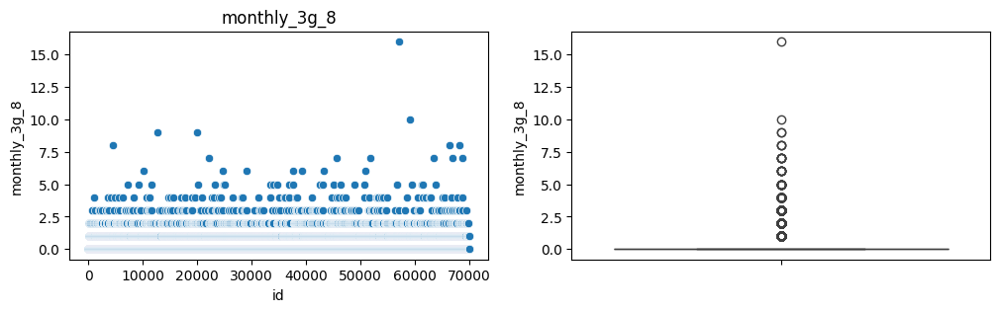

---------------------------------------------------------------------------
sachet_3g_6
unique vaules =  23


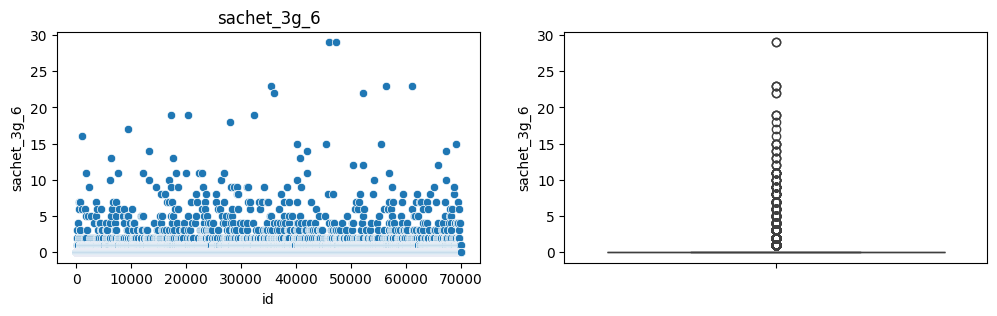

---------------------------------------------------------------------------
sachet_3g_7
unique vaules =  26


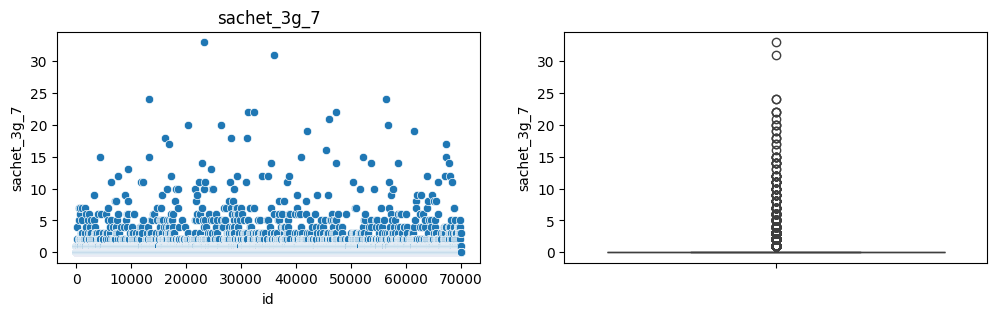

---------------------------------------------------------------------------
sachet_3g_8
unique vaules =  28


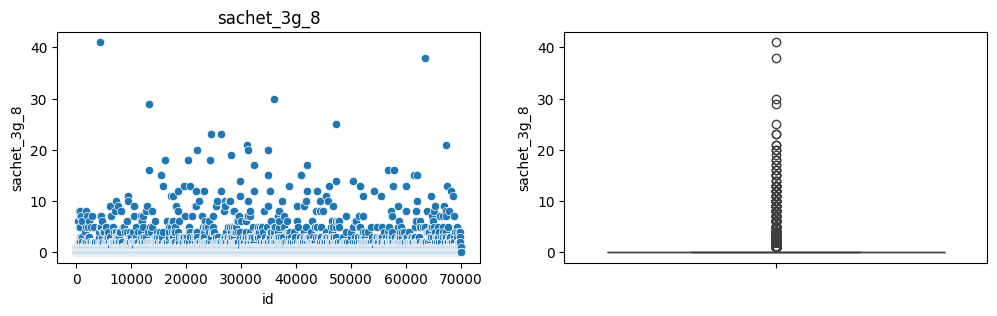

---------------------------------------------------------------------------
aon
unique vaules =  3455


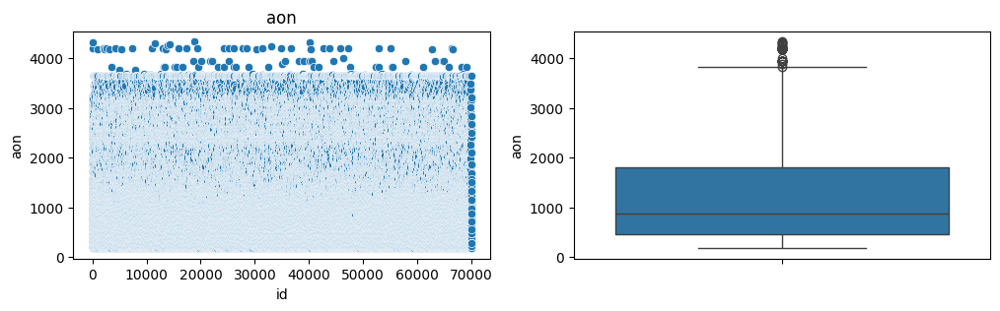

---------------------------------------------------------------------------
vbc_3g_8
unique vaules =  10609


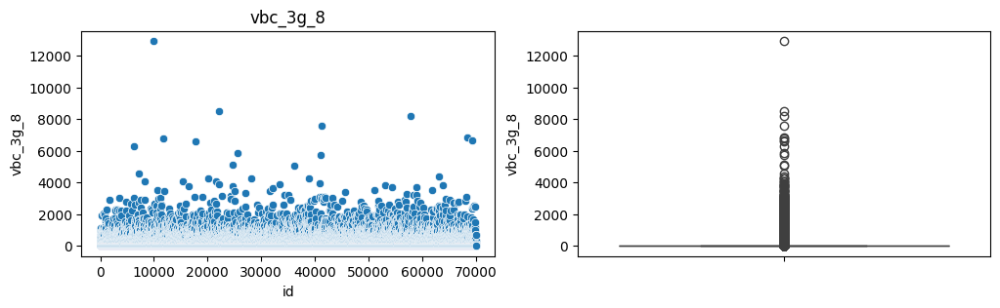

---------------------------------------------------------------------------
vbc_3g_7
unique vaules =  10257


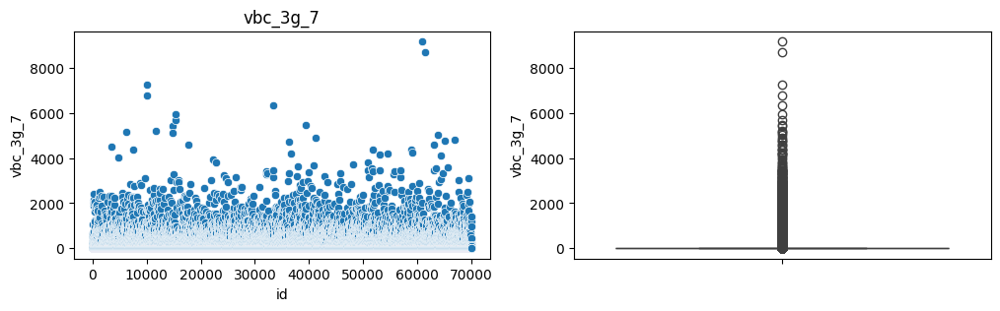

---------------------------------------------------------------------------
vbc_3g_6
unique vaules =  9617


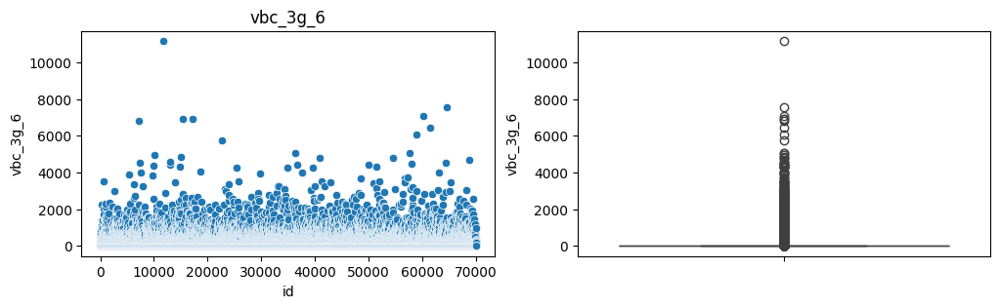

---------------------------------------------------------------------------
churn_probability
unique vaules =  2


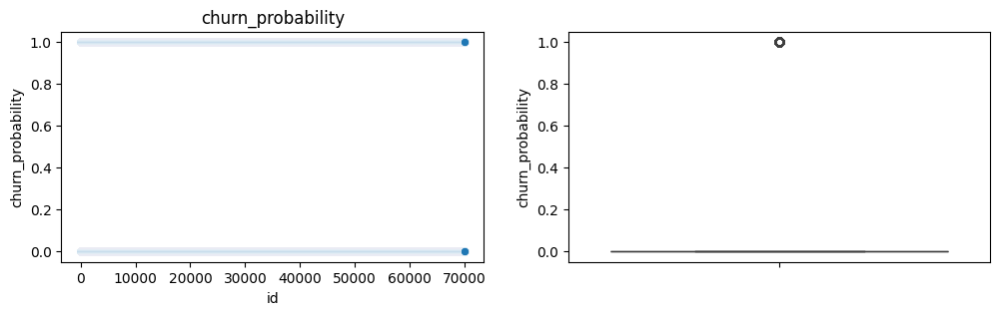

---------------------------------------------------------------------------


In [87]:
# plotting scateer plot and box plots
columns = data.columns
columns = [x for x in columns if x not in date_columns]

for feature in columns:
    print(feature)
    print('unique vaules = ', data[feature].nunique())
    
    fig, axs = plt.subplots(1,2, figsize=(12,3))
    sns.scatterplot(data=data, x='id', y=feature, ax=axs[0])
    axs[0].set_title(feature)    
    
    sns.boxplot(data=data, y=feature, ax=axs[1])
    plt.show()
    
    print('-' * 75)
    

In [88]:
# data.nunique()

### Handling Outliers

In [89]:
for feature in data.columns:
    if feature == LABEL_COLUMNS:
        continue
    
    lower_limit = data[feature].mean() - (2 * data[feature].std())
    upper_limit = data[feature].mean() + (2 * data[feature].std())
    
    data[feature] = data[feature].apply(lambda x: min(x, upper_limit) if x > upper_limit else max(x, lower_limit))

In [90]:
unseen.shape

(30000, 128)

### Dummy Variables - One Hot Encoding

- There are only numerical columns. these is no categorical variable. no need of dummy variables encoding.  
- Date columns need to consider as categorical variable.

## Taking Average of 6th, 7th and 8th month

In [91]:
# Separating 6th, 7th and 8th month data
jun = []
jul = []
aug = []

columns = data.columns
for feature in columns:
    if feature[-1] == '6':
        jun.append(feature)
    elif feature[-1] == '7':
        jul.append(feature)
    elif feature[-1] == '8':
        aug.append(feature)
        
print(jun)
print(jul)
print(aug)

data.shape

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'date_of_last_rech_6', 'last_day_rch_amt_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'vbc_3g_6']
['arpu_7', 'onnet_mou_7', 'offnet_mou_7', 'roam_ic_mou_7', 'roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'isd_og_mou_7',

(69999, 129)

In [92]:
data2 = pd.DataFrame()
unseen2 = pd.DataFrame()

for i in range(0, len(jun)): 
    feature = jun[i][:-2]
    if feature == 'date_of_last_rech': # skipping date column
        continue
    data2[feature] = (data[jun[i]] + data[jul[i]] + data[aug[i]]) / 3
    unseen2[feature] = (unseen[jun[i]] + unseen[jul[i]] + unseen[aug[i]]) / 3
    
data2['churn_probability'] = data['churn_probability']
# # data2.head()

len(unseen2.columns)

41

### Final data set

In [93]:
df_final = data2.copy()
unseen_final = unseen2.copy()

# Train test split

In [94]:
train_df, test_df = train_test_split(df_final, test_size=0.2, random_state=100)
train_df.shape, test_df.shape

((55999, 42), (14000, 42))

In [95]:
# X -  y split
y_train = train_df.pop(LABEL_COLUMNS)
X_train = train_df

y_test = test_df.pop(LABEL_COLUMNS)
X_test = test_df

# Get unseen final
X_unseen = unseen_final

In [96]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape, X_unseen.shape

((55999, 41), (55999,), (14000, 41), (14000,), (30000, 41))

# Scaling

In [97]:
# Standard Scaling converts data frame to numpy array
# So again converting it to data frame
columns = X_train.columns

# Apply Standard Scaler for dataset
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_unseen = scaler.transform(X_unseen)

X_train = pd.DataFrame(X_train, columns=columns)
X_test = pd.DataFrame(X_test, columns=columns)
X_unseen = pd.DataFrame(X_unseen, columns=columns)

# Visualize The Correlation before PCA

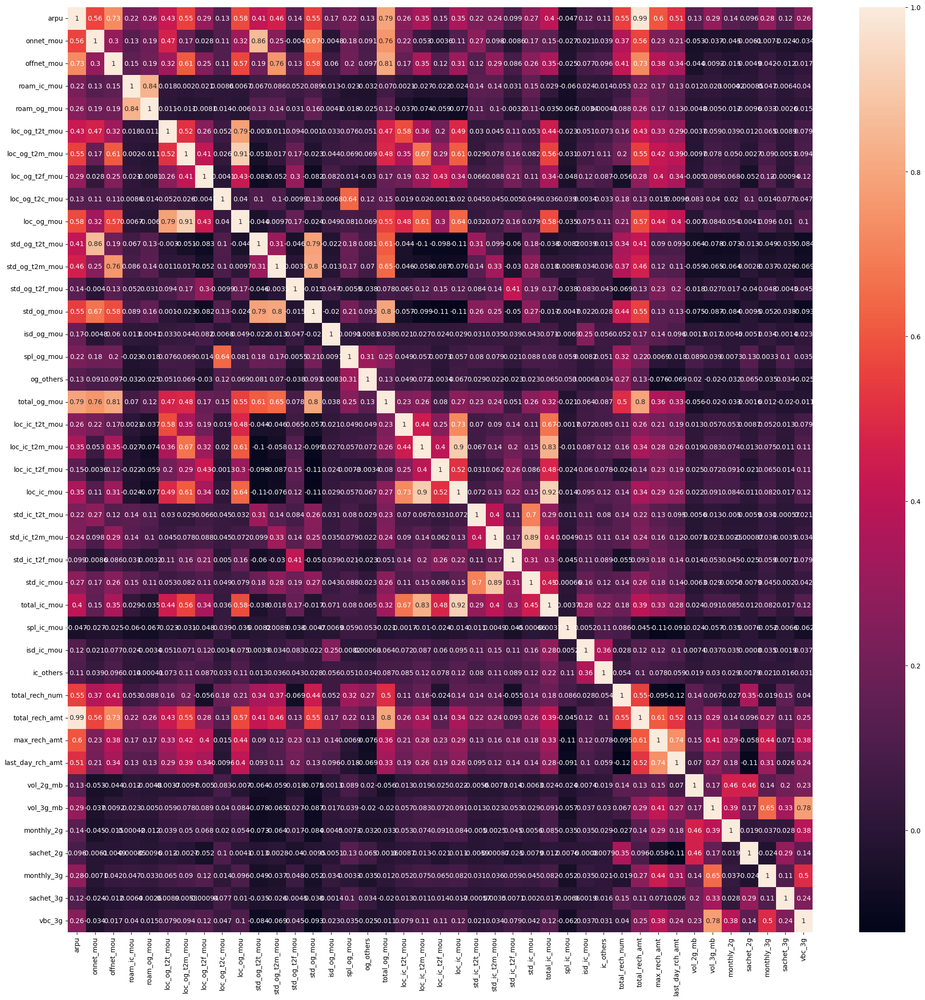

In [98]:
plt.figure(figsize=(25,25))
sns.heatmap(X_train.corr(), annot=True)
plt.show()

### Insight:
- There are few features which are highly correlated to each other.  
- PCA will remove the multi collinearity.

# PCA

In [99]:
pca = PCA(random_state=100)
pca.fit(X_train)

PCA(random_state=100)

In [100]:
pca.components_

array([[ 3.02568048e-01,  1.89241884e-01,  2.58579430e-01, ...,
         7.76435790e-02,  2.43647235e-02,  7.95338616e-02],
       [ 1.04880084e-01,  2.36136969e-01,  1.26968699e-01, ...,
        -9.45038623e-02, -2.44851981e-02, -1.26988074e-01],
       [ 1.24445028e-01, -4.82626328e-02, -5.79999006e-02, ...,
         3.42928328e-01,  2.02780766e-01,  4.04523936e-01],
       ...,
       [ 6.83881219e-01, -6.03026136e-02,  2.29728805e-02, ...,
        -1.17519593e-02, -1.37619665e-03, -7.20666835e-03],
       [ 1.38152991e-02,  2.09022406e-01,  7.04229618e-02, ...,
        -4.70279325e-03, -3.04910966e-05,  2.68084380e-03],
       [-4.56203250e-03,  2.86988774e-01,  2.50548092e-01, ...,
        -2.37097064e-03, -3.22296035e-05,  1.81023394e-03]])

In [101]:
pca.explained_variance_ratio_

array([2.09075334e-01, 1.11954521e-01, 7.49653550e-02, 6.13193686e-02,
       5.50468006e-02, 4.06376265e-02, 3.67716601e-02, 3.40801371e-02,
       3.32198113e-02, 3.11811161e-02, 2.78207890e-02, 2.50107560e-02,
       2.42426412e-02, 2.30277430e-02, 2.21495461e-02, 2.11131690e-02,
       1.84669617e-02, 1.78932023e-02, 1.72731712e-02, 1.48704146e-02,
       1.38371975e-02, 1.26228793e-02, 1.20475814e-02, 1.09082668e-02,
       9.34836649e-03, 7.76683908e-03, 6.93086930e-03, 6.38962760e-03,
       5.35787133e-03, 3.85822436e-03, 3.17930058e-03, 2.72128972e-03,
       1.18799978e-03, 9.02878713e-04, 7.47767431e-04, 5.23662847e-04,
       4.77599967e-04, 3.42710632e-04, 3.15465522e-04, 2.68357581e-04,
       1.45119723e-04])

In [102]:
variance_cummulative = np.cumsum(pca.explained_variance_ratio_)
variance_cummulative

array([0.20907533, 0.32102985, 0.39599521, 0.45731458, 0.51236138,
       0.55299901, 0.58977067, 0.6238508 , 0.65707061, 0.68825173,
       0.71607252, 0.74108328, 0.76532592, 0.78835366, 0.81050321,
       0.83161637, 0.85008334, 0.86797654, 0.88524971, 0.90012012,
       0.91395732, 0.9265802 , 0.93862778, 0.94953605, 0.95888442,
       0.96665125, 0.97358212, 0.97997175, 0.98532962, 0.98918785,
       0.99236715, 0.99508844, 0.99627644, 0.99717932, 0.99792708,
       0.99845075, 0.99892835, 0.99927106, 0.99958652, 0.99985488,
       1.        ])

### Scree plot

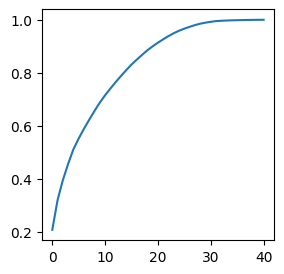

In [103]:
plt.figure(figsize=(3,3))
plt.plot(variance_cummulative)
plt.show()

### Insight:
- If we choose 25 variables, we can retain 95% of information.  
- So by selecting only 25 variables out of 41 variables, data loss is 5% 

In [104]:
# Choosing 25 variables out of 41 variables
pca = PCA(n_components=25, random_state=100)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
X_unseen = pca.transform(X_unseen)
X_train.shape, X_test.shape, X_unseen.shape

((55999, 25), (14000, 25), (30000, 25))

## TOP 25 Most Important Features

In [105]:
n_pcs= pca.components_.shape[0]

most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]

most_important_names = [train_df.columns[most_important[i]] for i in range(n_pcs)]

dic = {'PC{}'.format(i+1): most_important_names[i] for i in range(n_pcs)}

df = pd.DataFrame(sorted(dic.items()), columns=['pc', 'feature'])

df

,pc,feature
0,PC1,arpu
1,PC10,vol_2g_mb
2,PC11,monthly_2g
3,PC12,isd_og_mou
4,PC13,spl_ic_mou
5,PC14,og_others
6,PC15,og_others
7,PC16,og_others
8,PC17,sachet_3g
9,PC18,monthly_2g


# Correlation after PCA

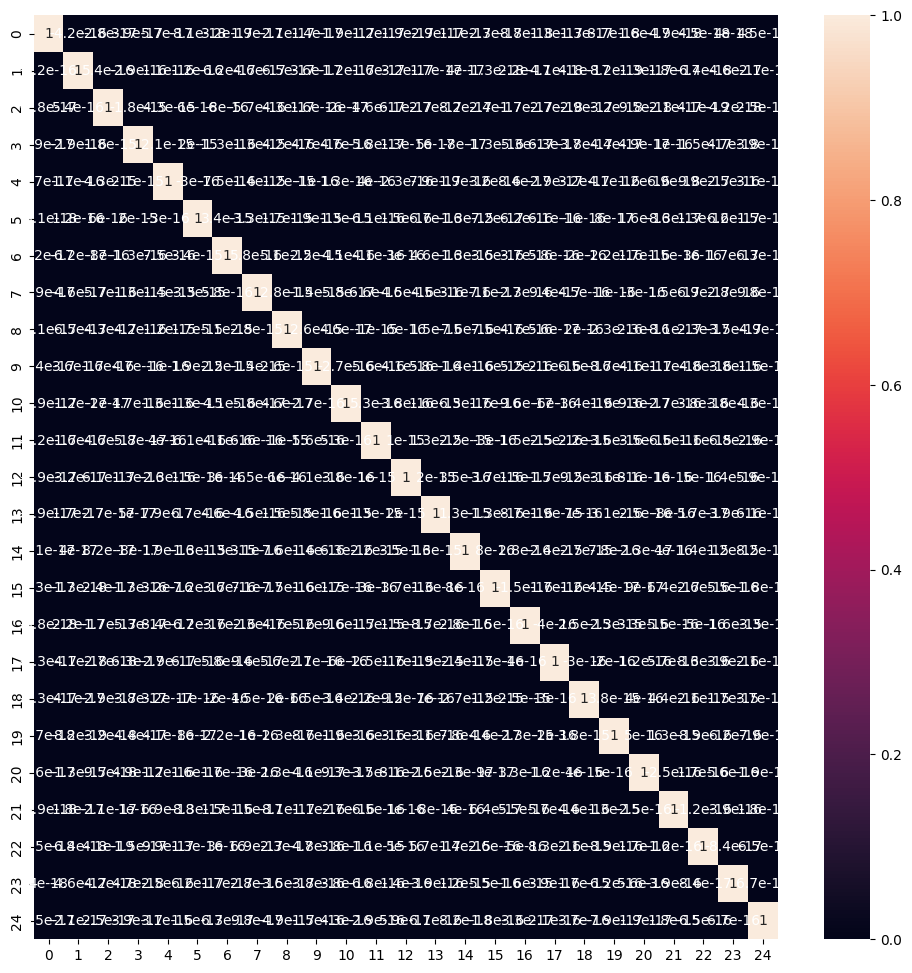

In [106]:
plt.figure(figsize=(12,12))
sns.heatmap(np.corrcoef(X_train.transpose()), annot=True)
plt.show()

### Insight:
- We can see that PCA has removed the multicollinearity in the features.
- And we dropped from 41 features to 25 features with retaining 95% data information

# Saving the data in file  
- So that I can run the notebook from here.  
- Delete these few lines later



In [107]:
# Saving pca output in csv file
np.savetxt(x_train_pca, X=X_train, delimiter=',', fmt='%f')
X_train = np.loadtxt(x_train_pca, delimiter=',')
X_train[:1,:]

array([[-3.220393, -0.267416, -0.768893, -0.180897, -0.720181, -0.138849,
        -0.10309 , -0.257033, -0.149509, -0.140965,  0.19278 ,  0.436008,
         0.022754, -0.363063,  0.386826,  0.265992, -0.304641, -0.540855,
         0.093602,  0.197309, -0.013214,  0.08058 ,  0.165219,  0.165249,
         0.688659]])

In [108]:
np.savetxt(x_test_pca, X=X_test, delimiter=',', fmt='%f')
X_test = np.loadtxt(x_test_pca, delimiter=',')
X_test[:1,:]

array([[-1.15335 ,  2.985367, -0.404837, -0.954784,  0.329782, -0.148697,
         0.880579,  1.200678, -0.285082, -0.355571, -0.422965, -0.067902,
         0.67266 , -1.056494,  0.139933, -0.464362, -0.416842, -0.538887,
         0.246619, -0.180824, -0.08942 ,  0.335719,  0.253902, -0.082015,
         0.282404]])

In [109]:
y_train.to_csv(y_train_pca, index=False)
y_train = pd.read_csv(y_train_pca)
y_train.head()

,churn_probability
0,1
1,0
2,0
3,0
4,0


In [110]:
y_test.to_csv(y_test_pca, index=False)
y_test = pd.read_csv(y_test_pca)
y_test.head()

,churn_probability
0,1
1,1
2,0
3,0
4,1


In [111]:
np.savetxt(x_unseen_pca, X=X_unseen, delimiter=',', fmt='%f')
X_unseen = np.loadtxt(x_unseen_pca, delimiter=',')
X_unseen[:1,:]

array([[-3.119042,  0.006179, -0.940812, -0.320406,  0.129718, -0.474852,
         0.234046, -0.250148,  0.967874, -0.989921, -0.102018, -2.061132,
        -3.845834,  2.843013, -1.790694, -2.147914,  0.55072 ,  0.054401,
         0.399007, -0.446444, -0.780929,  0.064753, -0.032409, -0.538241,
         0.467631]])

## Load Preprocessing Data To Train Models

In [112]:
X_train = np.loadtxt(x_train_pca, delimiter=',')
X_train[:1]

array([[-3.220393, -0.267416, -0.768893, -0.180897, -0.720181, -0.138849,
        -0.10309 , -0.257033, -0.149509, -0.140965,  0.19278 ,  0.436008,
         0.022754, -0.363063,  0.386826,  0.265992, -0.304641, -0.540855,
         0.093602,  0.197309, -0.013214,  0.08058 ,  0.165219,  0.165249,
         0.688659]])

In [113]:
X_test = np.loadtxt(x_test_pca, delimiter=',')
X_test[:1,:]

array([[-1.15335 ,  2.985367, -0.404837, -0.954784,  0.329782, -0.148697,
         0.880579,  1.200678, -0.285082, -0.355571, -0.422965, -0.067902,
         0.67266 , -1.056494,  0.139933, -0.464362, -0.416842, -0.538887,
         0.246619, -0.180824, -0.08942 ,  0.335719,  0.253902, -0.082015,
         0.282404]])

In [114]:
y_train = pd.read_csv(y_train_pca)
y_train.head()

,churn_probability
0,1
1,0
2,0
3,0
4,0


In [115]:
y_test = pd.read_csv(y_test_pca)
y_test.head()

,churn_probability
0,1
1,1
2,0
3,0
4,1


In [116]:
y_train = y_train.values.reshape(-1,)
y_train

array([1, 0, 0, ..., 0, 0, 0])

------
## Model Building

In [117]:
# Evaluation metrics
def evaluation_metric(y_train, y_test, y_train_pred, y_test_pred, estimator_name=None):
    print("="*50)
    print("=================== {} =========================".format(estimator_name))
    print("="*50)
    print("Train data :")
    print("Confusion Metrix :")
    confusion = confusion_matrix(y_train, y_train_pred)
    print(confusion)
    print("Accuracy Score = ", metrics.accuracy_score(y_train, y_train_pred))
    tp = confusion[1,1]
    tn = confusion[0,0]
    fp = confusion[0,1]
    fn = confusion[1,0]
    sensitivity = tp / float(tp + fn)
    print('sensitivity = ', sensitivity)
    
    specificity = tn / float(tn + fp)
    print("Specificity = ", specificity)
    print("*" * 30)
    print()
    
    print("Test data :")
    print("Confusion Metrix :")
    confusion = confusion_matrix(y_test, y_test_pred)
    print(confusion)
    print("Accuracy Score = ", metrics.accuracy_score(y_test, y_test_pred))
    tp = confusion[1,1]
    tn = confusion[0,0]
    fp = confusion[0,1]
    fn = confusion[1,0]
    sensitivity = tp / float(tp + fn)
    print('sensitivity = ', sensitivity)
    
    specificity = tn / float(tn + fp)
    print("Specificity = ", specificity)

### Logistic Regression 

In [118]:
lr = LogisticRegression()
lr.fit(X_train, y_train)

y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

In [119]:
evaluation_metric(y_train, y_test, y_train_pred, y_test_pred)

=================== None =========================
Train data :
Confusion Metrix :
[[50064   195]
 [ 5556   184]]
Accuracy Score =  0.8973017375310274
sensitivity =  0.03205574912891986
Specificity =  0.9961200978929147
******************************

Test data :
Confusion Metrix :
[[12558    50]
 [ 1356    36]]
Accuracy Score =  0.8995714285714286
sensitivity =  0.02586206896551724
Specificity =  0.9960342639593909


-----
### Logistic Regression using RFE

In [120]:
logrfe = LogisticRegression()
rfe = RFE(logrfe, n_features_to_select=10)
rfe = rfe.fit(X_train, y_train)

In [121]:
rfe.support_

array([ True,  True, False, False,  True,  True, False, False, False,
        True, False,  True,  True, False,  True, False, False, False,
       False, False, False, False,  True, False,  True])

In [122]:
list(zip(rfe.support_, rfe.ranking_))

[(True, 1),
 (True, 1),
 (False, 13),
 (False, 12),
 (True, 1),
 (True, 1),
 (False, 15),
 (False, 10),
 (False, 8),
 (True, 1),
 (False, 6),
 (True, 1),
 (True, 1),
 (False, 4),
 (True, 1),
 (False, 3),
 (False, 7),
 (False, 2),
 (False, 16),
 (False, 11),
 (False, 14),
 (False, 5),
 (True, 1),
 (False, 9),
 (True, 1)]

In [123]:
selected_columns = []
for i in range(X_train.shape[1]):
    if rfe.support_[i] == True:
        selected_columns.append(i)

X_train_rfe = X_train[:,selected_columns]
X_test_rfe = X_test[:, selected_columns]

lr_rfe = LogisticRegression()
lr_rfe.fit(X_train_rfe, y_train)

LogisticRegression()

In [124]:
y_train_pred = lr_rfe.predict(X_train_rfe)
y_test_pred = lr_rfe.predict(X_test_rfe)
evaluation_metric(y_train, y_test, y_train_pred, y_test_pred)

=================== None =========================
Train data :
Confusion Metrix :
[[50055   204]
 [ 5548   192]]
Accuracy Score =  0.8972838800692869
sensitivity =  0.033449477351916376
Specificity =  0.9959410254879723
******************************

Test data :
Confusion Metrix :
[[12556    52]
 [ 1354    38]]
Accuracy Score =  0.8995714285714286
sensitivity =  0.027298850574712645
Specificity =  0.9958756345177665


### Insight:
- Accuracy did not change using RFE.  
- It is same as logic regression accuracy.   
- If we select 2 or 3 features in rfe, then also we get around 90% accuracy but confusion metrics is different. most of the data is considered as not churned. and Not churned is percentage is high, thats why we are getting almost same accuracy even with 2 or 3 features. 

--------
### Regularization

In [125]:
params = {'C': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

cv = 5
ridge_logreg = LogisticRegression(penalty='l2')

grid_search = GridSearchCV(estimator=ridge_logreg, 
                           param_grid=params,
                           cv=cv,
                           scoring='accuracy')

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4,
                               0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                               6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
                               1000]},
             scoring='accuracy')

In [126]:
best_model = grid_search.best_estimator_
best_model

LogisticRegression(C=0.01)

In [127]:
c = 0.01
ridge_logreg = LogisticRegression(penalty='l2', C=c)
ridge_logreg.fit(X_train, y_train)

LogisticRegression(C=0.01)

In [128]:
y_train_pred = ridge_logreg.predict(X_train)
y_test_pred = ridge_logreg.predict(X_test)
evaluation_metric(y_train, y_test, y_train_pred, y_test_pred)

=================== None =========================
Train data :
Confusion Metrix :
[[50097   162]
 [ 5572   168]]
Accuracy Score =  0.897605314380614
sensitivity =  0.02926829268292683
Specificity =  0.9967766967110369
******************************

Test data :
Confusion Metrix :
[[12564    44]
 [ 1360    32]]
Accuracy Score =  0.8997142857142857
sensitivity =  0.022988505747126436
Specificity =  0.996510152284264


In [129]:
ridge_logreg.coef_

array([[-0.3418862 ,  0.33044098, -0.0237924 ,  0.03555987, -0.1723573 ,
         0.18485554, -0.00940886, -0.04017483,  0.07769601, -0.21843596,
         0.10772074,  0.22994248,  0.19739957, -0.13714892,  0.29921831,
         0.16172853, -0.09206669, -0.12920152,  0.01320818,  0.04857718,
         0.01627356,  0.11068139,  0.14566478,  0.06948265,  0.81107818]])

### Insight:
- Regularization applies penalty term to loss function.  
- Regularization helps prevent overfitting.  
- But in this case rige regularization is not helping us.  
- Ridge regularization accuracy is similar to logistic regression accuracy.

----
### Lasso Regression

In [130]:
params = {
    'C': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]
 }

cv = 5
lasso_logreg = LogisticRegression(penalty='l1', solver='saga')

grid_search = GridSearchCV(estimator=lasso_logreg, 
                           param_grid=params,
                           cv=cv,
                           scoring='accuracy')

grid_search.fit(X_train, y_train)

best_lr_model = grid_search.best_estimator_
print(best_lr_model)

LogisticRegression(C=0.01, penalty='l1', solver='saga')


In [131]:
c = 0.01
lasso_logreg = LogisticRegression(penalty='l1', C=c, solver='saga')
lasso_logreg.fit(X_train, y_train)

LogisticRegression(C=0.01, penalty='l1', solver='saga')

In [132]:
lasso_y_train = lasso_logreg.predict(X_train)
lasso_y_test = lasso_logreg.predict(X_test)
evaluation_metric(y_train, y_test, lasso_y_train, lasso_y_test)

=================== None =========================
Train data :
Confusion Metrix :
[[50128   131]
 [ 5596   144]]
Accuracy Score =  0.8977303166127967
sensitivity =  0.025087108013937282
Specificity =  0.997393501661394
******************************

Test data :
Confusion Metrix :
[[12571    37]
 [ 1367    25]]
Accuracy Score =  0.8997142857142857
sensitivity =  0.017959770114942528
Specificity =  0.9970653553299492


In [133]:
lasso_logreg.coef_

array([[-0.3340221 ,  0.31165235, -0.00439527,  0.03433668, -0.16293359,
         0.16982949,  0.        , -0.01382164,  0.04976351, -0.18786521,
         0.07663713,  0.19989065,  0.17799134, -0.10089641,  0.27216316,
         0.11264602, -0.04537715, -0.09671893,  0.        ,  0.        ,
         0.        ,  0.06131352,  0.08112965,  0.        ,  0.78210424]])

### Insight:  
- Lasso regularization helps prevent overfitting as well as feature selection.  
- Few coefficients are 0. That mean those featurs are unnecessary in model building.  
- In this case lasso regression is giving very good result on train data and test data also.  
- Accuracy is 99%.
- Specificity and sensitivity is also high.
----- 

## Decision Tree

In [134]:
# Init a decision tree model
dt_base_model = DecisionTreeClassifier(random_state=100)

params = {
    "max_depth": [2, 3, 4, 5, 6, 7, 8, 9, 10, 20],
    "min_samples_leaf": [5, 10, 20, 50, 100]
}


dt_grid_search = GridSearchCV(estimator=dt_base_model,
                           param_grid=params,
                           cv=4,
                           n_jobs=-1, verbose=1, scoring="accuracy")



dt_grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [135]:
# Check the accuracy of the best model
dt_grid_search.best_score_

0.9029982498749911

In [136]:
# Get the best tree
dt_best = dt_grid_search.best_estimator_

In [137]:
# Decision Tree Evaluation
dt_y_train_pred = dt_best.predict(X_train)
dt_y_test_pred = dt_best.predict(X_test)
evaluation_metric(y_train, y_test, dt_y_train_pred, dt_y_test_pred, "Decision Tree")

=================== Decision Tree =========================
Train data :
Confusion Metrix :
[[49546   713]
 [ 4607  1133]]
Accuracy Score =  0.9049983035411346
sensitivity =  0.19738675958188154
Specificity =  0.9858134861417855
******************************

Test data :
Confusion Metrix :
[[12411   197]
 [ 1113   279]]
Accuracy Score =  0.9064285714285715
sensitivity =  0.20043103448275862
Specificity =  0.984375


--------------
## Random Forest

In [138]:
rf_base = RandomForestClassifier(random_state=100, n_jobs=-1)

params = {
    'max_depth': [5, 10, 20, 30],
    'min_samples_leaf': [5, 10, 20, 50],
    'n_estimators': [10, 20, 50, 100]
}

rf_grid_search = GridSearchCV(estimator=rf_base,
                              param_grid=params,
                              cv = 4,
                              n_jobs=-1,
                              scoring="accuracy")

rf_grid_search.fit(X_train, y_train)

GridSearchCV(cv=4,
             estimator=RandomForestClassifier(n_jobs=-1, random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20, 50],
                         'n_estimators': [10, 20, 50, 100]},
             scoring='accuracy')

In [139]:
rf_grid_search.best_score_

0.9073912077903523

In [140]:
rf_best = rf_grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=100)

In [141]:
# Decision Tree Evaluation
rf_y_train_pred = rf_best.predict(X_train)
rf_y_test_pred = rf_best.predict(X_test)
evaluation_metric(y_train, y_test, rf_y_train_pred, rf_y_test_pred, "Random Forest")

=================== Random Forest =========================
Train data :
Confusion Metrix :
[[50216    43]
 [ 3540  2200]]
Accuracy Score =  0.936016714584189
sensitivity =  0.3832752613240418
Specificity =  0.999144431843053
******************************

Test data :
Confusion Metrix :
[[12535    73]
 [ 1180   212]]
Accuracy Score =  0.9105
sensitivity =  0.15229885057471265
Specificity =  0.9942100253807107


<BarContainer object of 25 artists>

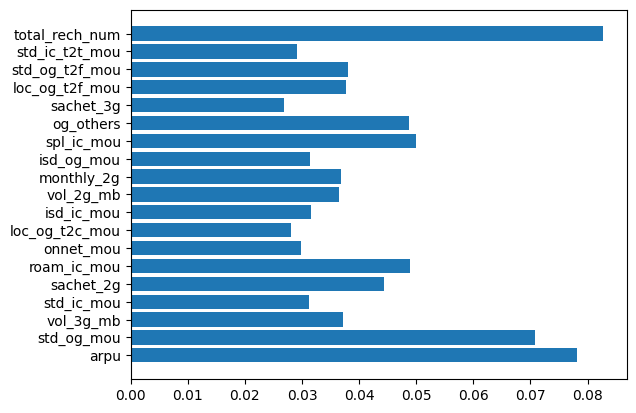

In [142]:
# Show feature important
plt.barh(most_important_names, rf_best.feature_importances_)

--------------
## XGBoost

In [143]:
xgb_base = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')

params = {
        'n_estimators' : [10, 20, 50, 100, 200],
        'learning_rate' : [0.01, 0.02, 0.05, 0.1, 0.25],
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.1, 0.5, 1, 1.5, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 10, 12]
        }

param_comb = 800

random_search = RandomizedSearchCV(xgb_base, 
                                   param_distributions=params, 
                                   n_iter=param_comb, scoring='accuracy', 
                                   n_jobs=-1, cv=4, verbose=0, random_state=100)

random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=4,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           n_estimators=None, n_jobs=-1,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=800, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.1, 0.5, 1, 1.5, 5],
                                        'learning_rate': [0.01, 0.02, 0.05, 0.1,
                                                          0.25],
                                        'max_depth': [3, 4, 5, 10, 12],
                                        'min_child_weight': [1, 5, 7, 10],
                                        'n_estimators': [10, 20, 50, 100, 200],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=100, scoring='accuracy')

In [144]:
random_search.best_score_

0.9084269412100865

In [145]:
xgb_best = random_search.best_estimator_

In [146]:
# Decision Tree Evaluation
xgb_y_train_pred = xgb_best.predict(X_train)
xgb_y_test_pred = xgb_best.predict(X_test)
evaluation_metric(y_train, y_test, xgb_y_train_pred, xgb_y_test_pred, "XGBoost")

=================== XGBoost =========================
Train data :
Confusion Metrix :
[[50018   241]
 [ 4077  1663]]
Accuracy Score =  0.9228914802050037
sensitivity =  0.2897212543554007
Specificity =  0.9952048389343202
******************************

Test data :
Confusion Metrix :
[[12483   125]
 [ 1130   262]]
Accuracy Score =  0.9103571428571429
sensitivity =  0.1882183908045977
Specificity =  0.9900856598984772


-------------------
## Validate Model With Unseen Data

### The best estimator use to predict on Unseen data is XGboost

In [148]:
X_unseen = np.loadtxt(x_unseen_pca, delimiter=',')
X_unseen[:1,:]

array([[-3.119042,  0.006179, -0.940812, -0.320406,  0.129718, -0.474852,
         0.234046, -0.250148,  0.967874, -0.989921, -0.102018, -2.061132,
        -3.845834,  2.843013, -1.790694, -2.147914,  0.55072 ,  0.054401,
         0.399007, -0.446444, -0.780929,  0.064753, -0.032409, -0.538241,
         0.467631]])

In [149]:
xgb_y_unseen = xgb_best.predict(X_unseen)

In [150]:
xgb_y_unseen_df = pd.DataFrame(xgb_y_unseen, columns=[LABEL_COLUMNS])
xgb_y_unseen_df.head()

,churn_probability
0,0
1,0
2,0
3,0
4,0


In [151]:
xgb_y_unseen_df.value_counts()

churn_probability
0                    29189
1                      811
Name: count, dtype: int64

In [152]:
xgb_y_unseen_df.to_csv(y_unseen_pca)